In [1]:
import matplotlib.pyplot as plt
import pydicom
import numpy as np
import SimpleITK as sitk
import os
import cv2
from skimage.measure import label 

In [2]:
def denorm(x):
    """Convert the range from [-1, 1] to [0, 1]."""
    out = (x + 1) / 2
    return out

def renormalize(ary):
    """Convert the range from [0, 1] to [-1000, 1000]."""
    re_ary = (ary*(1000. + 1000.)) - 1000.
    return re_ary

def _preprocess_cbct_ct(dicom):
    hu_data = dicom.pixel_array.astype(np.float32) * dicom.RescaleSlope + dicom.RescaleIntercept
    clip_hu = np.clip(hu_data, -1000, 1000)
    nor_hu = (clip_hu + 1000.) / (1000. + 1000.)
    return clip_hu
def _preprocess_mri(dicom):
    pixel_array = dicom.pixel_array.astype(np.float32) * dicom.RescaleSlope + dicom.RescaleIntercept
    clip_in = np.clip(pixel_array, 0, 1500)
    nor_hu = clip_in / (1500)
    return clip_in

def read_dicom_series(dicom_directory):
    dicom_files = [os.path.join(dicom_directory, filename) for filename in os.listdir(dicom_directory) if filename.endswith('.dcm')]
    dicom_files.sort()
    dicom_slices = [pydicom.read_file(file_path) for file_path in dicom_files]
    image_array = np.stack([_preprocess_cbct_ct(slice) for slice in dicom_slices])
    return image_array

In [90]:
case = [11,12,22,41,42,60]
ct = []
cbct = []
mri = []
ccb = []
cmr = []
scb = []
smr = []
for i in range(len(case)):
    print(case[i])
    ct_i = read_dicom_series(f'test/case {case[i]}/CT')
    if case[i] != 60:
        cbct_i = read_dicom_series(f'test/case {case[i]}/CBCT')
        ccb_i = read_dicom_series(f'From training computer/My_CycleGAN/CycleCBCT_lossfix/results/itemA_DICOM/Case_{case[i]}')
        scb_i = read_dicom_series(f'train_model/StarGAN/results/test_CBCT/CBCT_DICOM/Case_{case[i]}')
    if case[i] != 22:
        mri_i = read_dicom_series(f'test/case {case[i]}/MRI')
        cmr_i = read_dicom_series(f'From training computer/My_CycleGAN/CycleMRI_lossfix/results/test/itemA_DICOM/Case_{case[i]}')
        smr_i = read_dicom_series(f'train_model/StarGAN/results/test_MRI/MRI_DICOM/Case_{case[i]}')
    ct.append(ct_i)
    if case[i] != 60:
        cbct.append(cbct_i)
        ccb.append(ccb_i)
        scb.append(scb_i)
    if case[i] != 22:
        mri.append(mri_i)
        cmr.append(cmr_i)
        smr.append(smr_i)
ct = np.stack(ct)
cbct = np.stack(cbct)
mri = np.stack(mri)
ccb = np.stack(ccb)
cmr = np.stack(cmr)
scb = np.stack(scb)
smr = np.stack(smr)

11
12
22
41
42
60


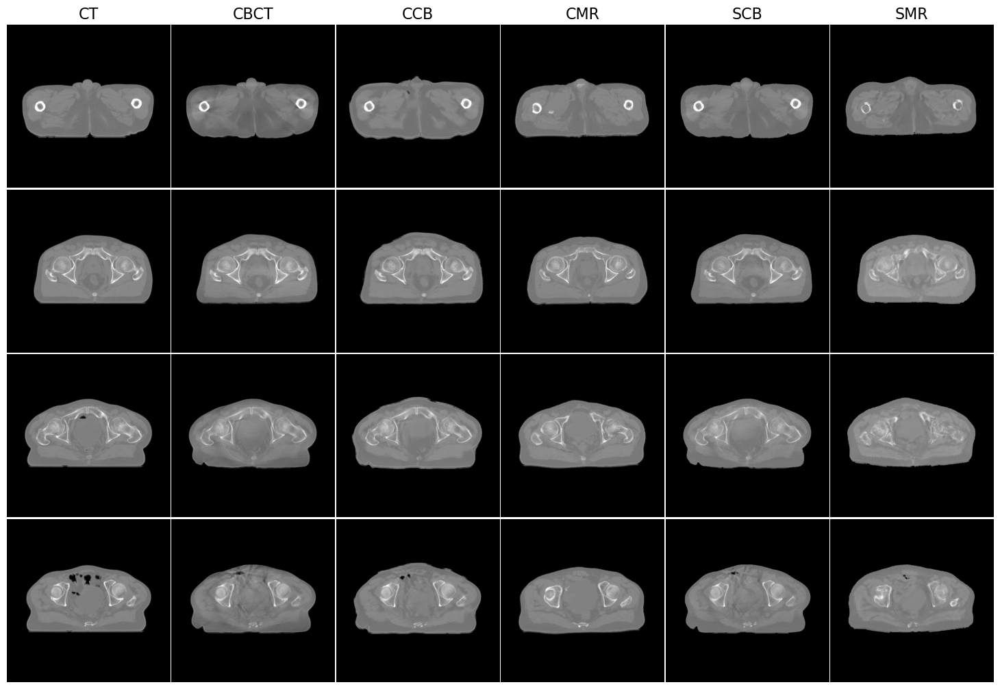

In [91]:
dict = {11:0, 12:1, 41:2, 42:3}
case = [dict[11], dict[12], dict[11], dict[11]]
slice = [2, 22, 33, 41]

plt.figure(figsize=(18,12))
# Adjust the space between subplots
plt.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.01) # height reserved for space between subplots
plt.subplot(4,6,1); plt.imshow(ct[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CT', fontsize=16)
plt.subplot(4,6,2); plt.imshow(cbct[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CBCT', fontsize=16)
plt.subplot(4,6,3); plt.imshow(ccb[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CCB', fontsize=16)
plt.subplot(4,6,4); plt.imshow(cmr[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CMR', fontsize=16)
plt.subplot(4,6,5); plt.imshow(scb[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('SCB', fontsize=16)
plt.subplot(4,6,6); plt.imshow(smr[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('SMR', fontsize=16)

plt.subplot(4,6,7); plt.imshow(ct[case[1]][slice[1]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,8); plt.imshow(cbct[case[1]][slice[1]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,9); plt.imshow(ccb[case[1]][slice[1]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,10); plt.imshow(cmr[case[1]][slice[1]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,11); plt.imshow(scb[case[1]][slice[1]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,12); plt.imshow(smr[case[1]][slice[1]], cmap='gray'); plt.axis('off')

plt.subplot(4,6,13); plt.imshow(ct[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,14); plt.imshow(cbct[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,15); plt.imshow(ccb[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,16); plt.imshow(cmr[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,17); plt.imshow(scb[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,18); plt.imshow(smr[case[2]][slice[2]], cmap='gray'); plt.axis('off')

plt.subplot(4,6,19); plt.imshow(ct[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,20); plt.imshow(cbct[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,21); plt.imshow(ccb[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,22); plt.imshow(cmr[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,23); plt.imshow(scb[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(4,6,24); plt.imshow(smr[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.show()

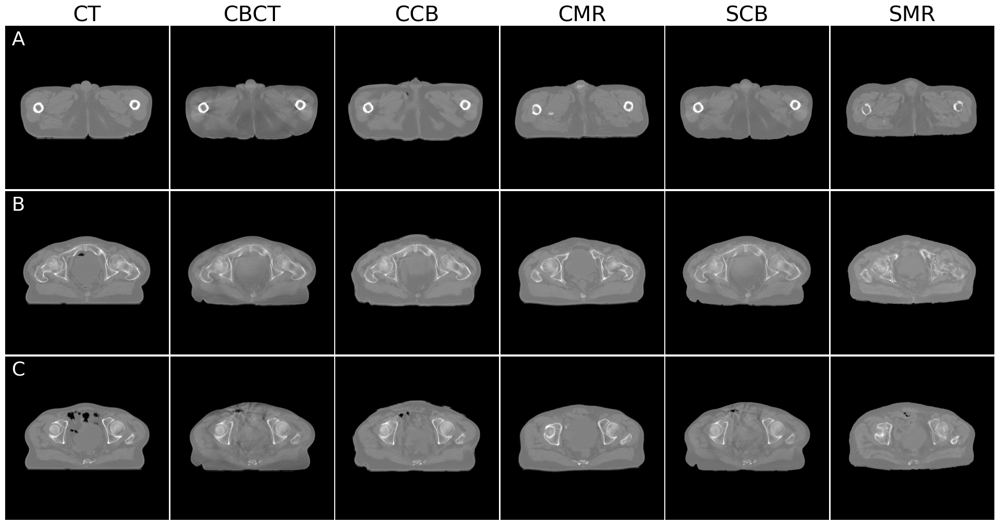

In [92]:
dict = {11:0, 12:1, 41:3, 42:4}
case = [dict[11], dict[41], dict[11], dict[11]]
slice = [2, 22, 33, 41]

plt.figure(figsize=(24,12))
# Adjust the space between subplots
plt.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.01) # height reserved for space between subplots
plt.subplot(3,6,1); plt.imshow(ct[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CT', fontsize=30)
plt.annotate('A', xy=(20, 60), color='w',fontsize=27)
plt.subplot(3,6,2); plt.imshow(cbct[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CBCT', fontsize=30)
plt.subplot(3,6,3); plt.imshow(ccb[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CCB', fontsize=30)
plt.subplot(3,6,4); plt.imshow(cmr[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CMR', fontsize=30)
plt.subplot(3,6,5); plt.imshow(scb[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('SCB', fontsize=30)
plt.subplot(3,6,6); plt.imshow(smr[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('SMR', fontsize=30)

plt.subplot(3,6,7); plt.imshow(ct[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.annotate('B', xy=(20, 60), color='w',fontsize=27)
plt.subplot(3,6,8); plt.imshow(cbct[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(3,6,9); plt.imshow(ccb[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(3,6,10); plt.imshow(cmr[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(3,6,11); plt.imshow(scb[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(3,6,12); plt.imshow(smr[case[2]][slice[2]], cmap='gray'); plt.axis('off')

plt.subplot(3,6,13); plt.imshow(ct[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.annotate('C', xy=(20, 60), color='w',fontsize=27)
plt.subplot(3,6,14); plt.imshow(cbct[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(3,6,15); plt.imshow(ccb[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(3,6,16); plt.imshow(cmr[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(3,6,17); plt.imshow(scb[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(3,6,18); plt.imshow(smr[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.show()

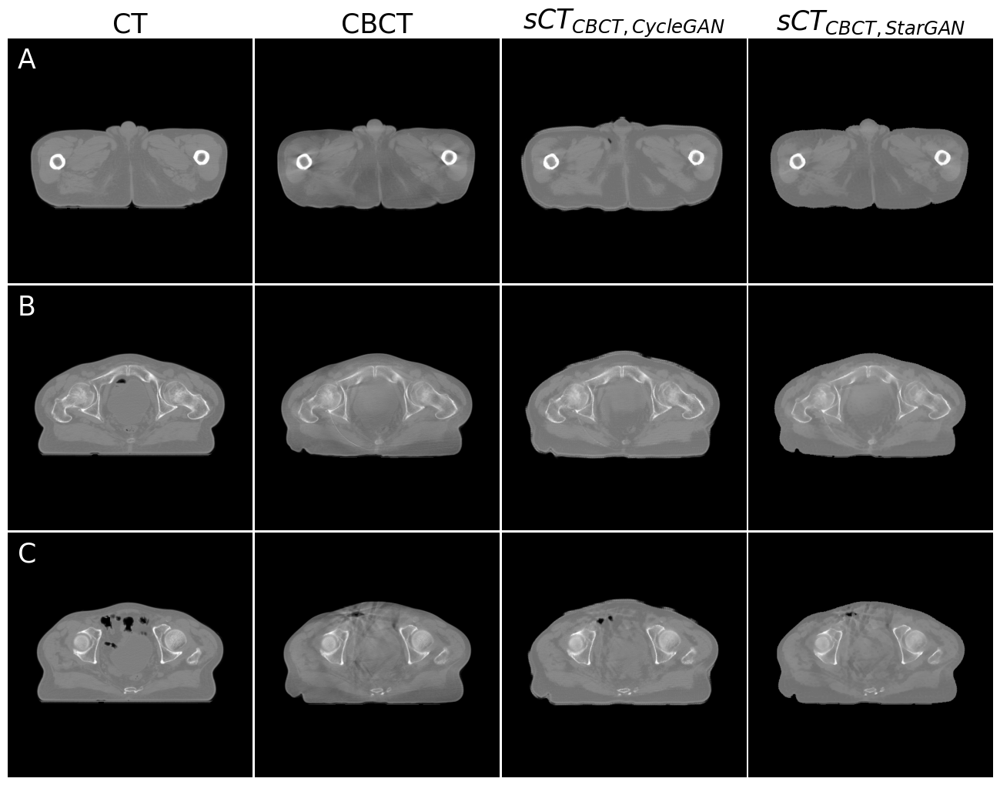

In [99]:
dict = {11:0, 12:1, 41:3, 42:4}
case = [dict[11], dict[41], dict[11], dict[11]]
slice = [2, 22, 33, 41]

plt.figure(figsize=(16,12))
# Adjust the space between subplots
plt.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.01) # height reserved for space between subplots
plt.subplot(3,4,1); plt.imshow(ct[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CT', fontsize=25)
plt.annotate('A', xy=(20, 60), color='w',fontsize=25)
plt.subplot(3,4,2); plt.imshow(cbct[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CBCT', fontsize=25)
plt.subplot(3,4,3); plt.imshow(ccb[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('$sCT_{CBCT,CycleGAN}$', fontsize=25)
plt.subplot(3,4,4); plt.imshow(scb[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('$sCT_{CBCT,StarGAN}$', fontsize=25)

plt.subplot(3,4,5); plt.imshow(ct[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.annotate('B', xy=(20, 60), color='w',fontsize=25)
plt.subplot(3,4,6); plt.imshow(cbct[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(3,4,7); plt.imshow(ccb[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(3,4,8); plt.imshow(scb[case[2]][slice[2]], cmap='gray'); plt.axis('off')

plt.subplot(3,4,9); plt.imshow(ct[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.annotate('C', xy=(20, 60), color='w',fontsize=25)
plt.subplot(3,4,10); plt.imshow(cbct[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(3,4,11); plt.imshow(ccb[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(3,4,12); plt.imshow(scb[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.show()

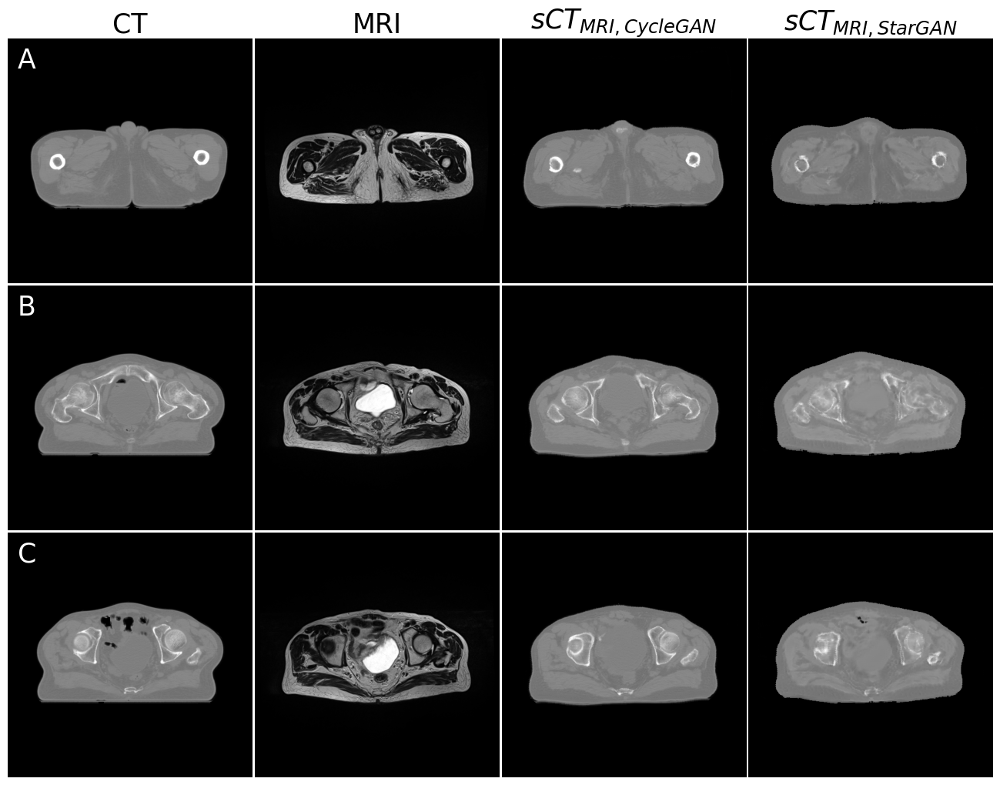

In [94]:
dict = {11:0, 12:1, 41:3, 42:4}
case = [dict[11], dict[41], dict[11], dict[11]]
slice = [2, 22, 33, 41]

plt.figure(figsize=(16,12))
# Adjust the space between subplots
plt.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.01) # height reserved for space between subplots
plt.subplot(3,4,1); plt.imshow(ct[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('CT', fontsize=25)
plt.annotate('A', xy=(20, 60), color='w',fontsize=25)
plt.subplot(3,4,2); plt.imshow(mri[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('MRI', fontsize=25)
plt.subplot(3,4,3); plt.imshow(cmr[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('$sCT_{MRI,CycleGAN}$', fontsize=25)
plt.subplot(3,4,4); plt.imshow(smr[case[0]][slice[0]], cmap='gray'); plt.axis('off'); plt.title('$sCT_{MRI,StarGAN}$', fontsize=25)

plt.subplot(3,4,5); plt.imshow(ct[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.annotate('B', xy=(20, 60), color='w',fontsize=25)
plt.subplot(3,4,6); plt.imshow(mri[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(3,4,7); plt.imshow(cmr[case[2]][slice[2]], cmap='gray'); plt.axis('off')
plt.subplot(3,4,8); plt.imshow(smr[case[2]][slice[2]], cmap='gray'); plt.axis('off')

plt.subplot(3,4,9); plt.imshow(ct[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.annotate('C', xy=(20, 60), color='w',fontsize=25)
plt.subplot(3,4,10); plt.imshow(mri[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(3,4,11); plt.imshow(cmr[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.subplot(3,4,12); plt.imshow(smr[case[3]][slice[3]], cmap='gray'); plt.axis('off')
plt.show()

(-0.5, 511.5, 43.5, -0.5)

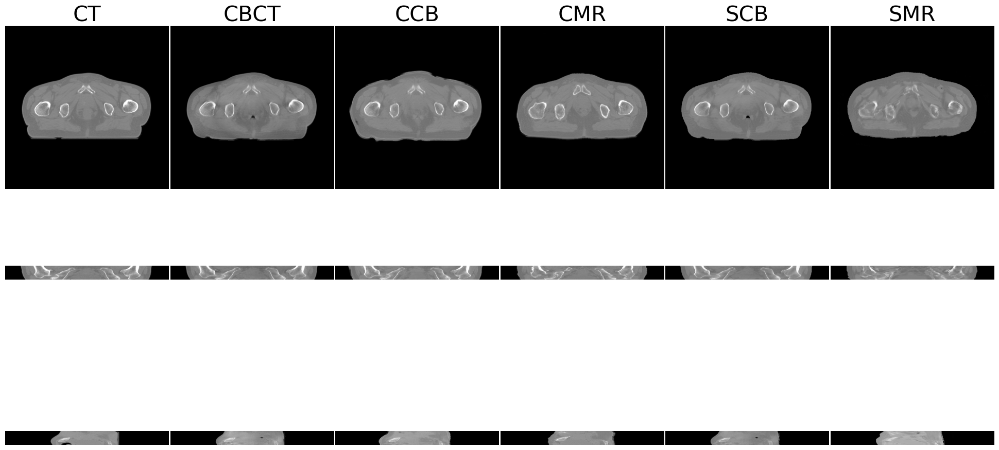

In [95]:
dict = {11:0, 12:1, 22:2, 41:3, 42:4}
case = [dict[11], dict[22], dict[11], dict[11]]
slice = [2, 22, 33, 41]

plt.figure(figsize=(24,12))
# Adjust the space between subplots
plt.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.01) # height reserved for space between subplots
plt.subplot(3,6,1); plt.imshow(ct[case[0]][22], cmap='gray'); plt.axis('off'); plt.title('CT', fontsize=30)
plt.subplot(3,6,2); plt.imshow(cbct[case[0]][22], cmap='gray'); plt.axis('off'); plt.title('CBCT', fontsize=30)
plt.subplot(3,6,3); plt.imshow(ccb[case[0]][22], cmap='gray'); plt.axis('off'); plt.title('CCB', fontsize=30)
plt.subplot(3,6,4); plt.imshow(cmr[case[0]][22], cmap='gray'); plt.axis('off'); plt.title('CMR', fontsize=30)
plt.subplot(3,6,5); plt.imshow(scb[case[0]][22], cmap='gray'); plt.axis('off'); plt.title('SCB', fontsize=30)
plt.subplot(3,6,6); plt.imshow(smr[case[0]][22], cmap='gray'); plt.axis('off'); plt.title('SMR', fontsize=30)

plt.subplot(3,6,7); plt.imshow(ct[case[2]][:,256,:], cmap='gray'); plt.axis('off')
plt.subplot(3,6,8); plt.imshow(cbct[case[2]][:,256,:], cmap='gray'); plt.axis('off')
plt.subplot(3,6,9); plt.imshow(ccb[case[2]][:,256,:], cmap='gray'); plt.axis('off')
plt.subplot(3,6,10); plt.imshow(cmr[case[2]][:,256,:], cmap='gray'); plt.axis('off')
plt.subplot(3,6,11); plt.imshow(scb[case[2]][:,256,:], cmap='gray'); plt.axis('off')
plt.subplot(3,6,12); plt.imshow(smr[case[2]][:,256,:], cmap='gray'); plt.axis('off')

plt.subplot(3,6,13); plt.imshow(ct[case[3]][:,:,256], cmap='gray'); plt.axis('off')
plt.subplot(3,6,14); plt.imshow(cbct[case[3]][:,:,256], cmap='gray'); plt.axis('off')
plt.subplot(3,6,15); plt.imshow(ccb[case[3]][:,:,256], cmap='gray'); plt.axis('off')
plt.subplot(3,6,16); plt.imshow(cmr[case[3]][:,:,256], cmap='gray'); plt.axis('off')
plt.subplot(3,6,17); plt.imshow(scb[case[3]][:,:,256], cmap='gray'); plt.axis('off')
plt.subplot(3,6,18); plt.imshow(smr[case[3]][:,:,256], cmap='gray'); plt.axis('off')

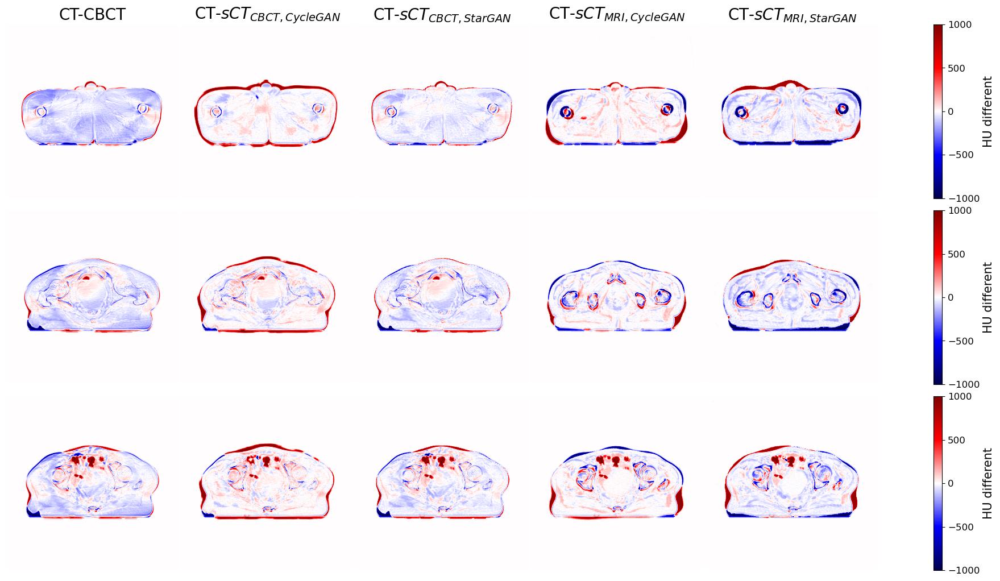

In [111]:
dict = {11:0, 12:1, 22:2, 41:3, 42:4}
case = [dict[11], dict[11], dict[11], dict[11]]
slice = [2, 22, 33, 41]

cbct_diff_c1 = cbct[case[0]][slice[0]] - ct[case[0]][slice[0]]
ccb_diff_c1 =  ccb[case[0]][slice[0]] - ct[case[0]][slice[0]]
cmr_diff_c1 =  cmr[case[0]][slice[0]] - ct[case[0]][slice[0]]
scb_diff_c1 =  scb[case[0]][slice[0]] - ct[case[0]][slice[0]]
smr_diff_c1 =  smr[case[0]][slice[0]] - ct[case[0]][slice[0]]

cbct_diff_c2 = cbct[case[1]][slice[1]] - ct[case[1]][slice[1]] 
ccb_diff_c2 = ccb[case[1]][slice[1]] - ct[case[1]][slice[1]] 
cmr_diff_c2 = cmr[case[1]][slice[1]] - ct[case[1]][slice[1]]
scb_diff_c2 = scb[case[1]][slice[1]] - ct[case[1]][slice[1]] 
smr_diff_c2 = smr[case[1]][slice[1]] - ct[case[1]][slice[1]]  

cbct_diff_c3 = cbct[case[2]][slice[2]] - ct[case[2]][slice[2]] 
ccb_diff_c3 = ccb[case[2]][slice[2]] - ct[case[2]][slice[2]] 
cmr_diff_c3 = cmr[case[2]][slice[2]] - ct[case[2]][slice[2]] 
scb_diff_c3 = scb[case[2]][slice[2]] - ct[case[2]][slice[2]] 
smr_diff_c3 = smr[case[2]][slice[2]] - ct[case[2]][slice[2]] 

cbct_diff_c4 = cbct[case[3]][slice[3]] - ct[case[3]][slice[3]] 
ccb_diff_c4 = ccb[case[3]][slice[3]] - ct[case[3]][slice[3]] 
cmr_diff_c4 = cmr[case[3]][slice[3]] - ct[case[3]][slice[3]]
scb_diff_c4 = scb[case[3]][slice[3]] - ct[case[3]][slice[3]] 
smr_diff_c4 = smr[case[3]][slice[3]] - ct[case[3]][slice[3]]

fig, axs = plt.subplots(3, 5, figsize=(24, 12), sharex=True, sharey=True)
fig.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.07) # height reserved for space between subplots

data_list = [cbct_diff_c1, ccb_diff_c1, scb_diff_c1, cmr_diff_c1,  smr_diff_c1,
             cbct_diff_c3, ccb_diff_c3, scb_diff_c3, cmr_diff_c2,  smr_diff_c2,
             cbct_diff_c4, ccb_diff_c4, scb_diff_c4, cmr_diff_c4,  smr_diff_c4]
titles = ["CT-CBCT", "CT-$sCT_{CBCT,CycleGAN}$", "CT-$sCT_{CBCT,StarGAN}$", "CT-$sCT_{MRI,CycleGAN}$",  "CT-$sCT_{MRI,StarGAN}$",
          "CBCT-c3", "CCB-c3", "CMR-c3", "SCB-c3", "SMR-c3", 
          "CBCT-c4", "CCB-c4", "CMR-c4", "SCB-c3", "SMR-c3",]


for i, (data, title, ax) in enumerate(zip(data_list, titles, axs.flat)):
    im = ax.imshow(data, cmap='seismic', vmin=-1000, vmax=1000)
    if i < 5:  # Add titles only for the first row
        ax.set_title(title, fontsize=20)
    ax.axis('off')

    # Add colorbar for each row, starting from the second subplot
    if i % 5 == 1:
        cbar = fig.colorbar(im, ax=axs[i // 5, :], label='HU different', location='right')
        cbar.ax.tick_params(labelsize=12)
        cbar.set_label('HU different', fontsize=15)
        cbar.set_ticks([-1000, -500, 0, 500, 1000])
plt.show()

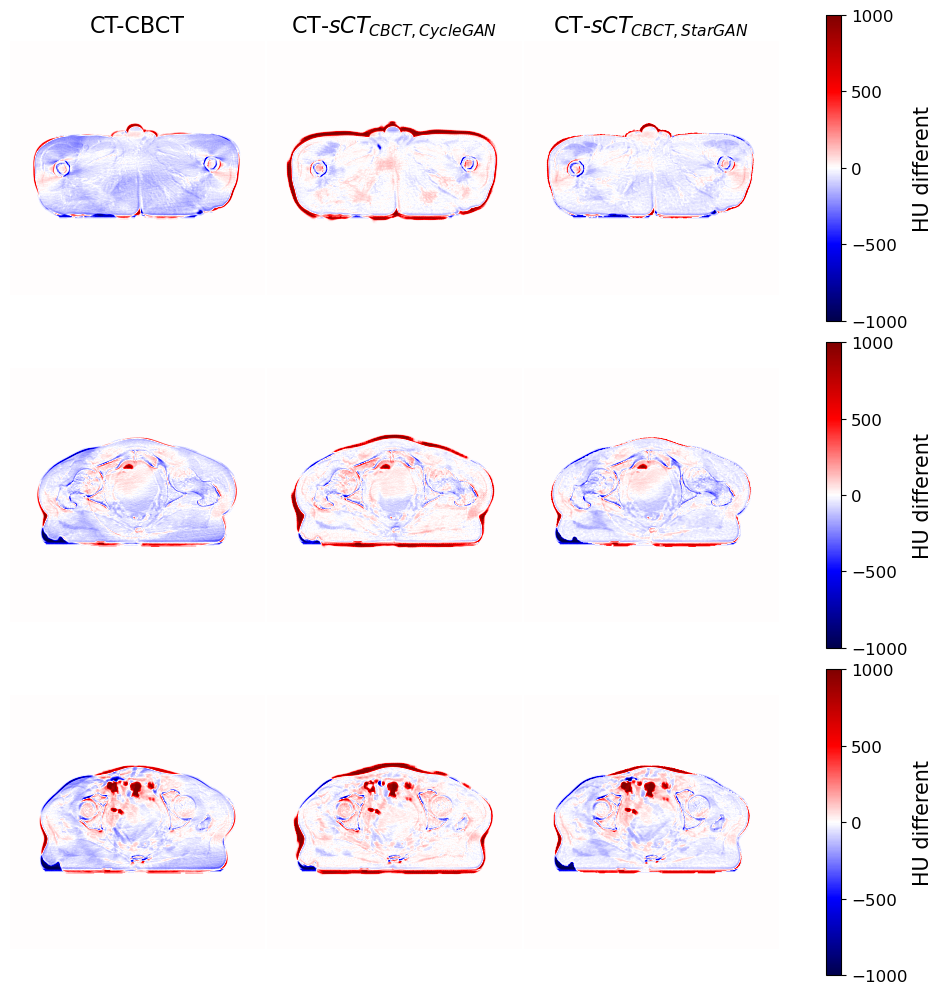

In [112]:
dict = {11:0, 12:1, 22:2, 41:3, 42:4}
case = [dict[11], dict[22], dict[11], dict[11]]
slice = [2, 22, 33, 41]

cbct_diff_c1 = cbct[case[0]][slice[0]] - ct[case[0]][slice[0]]
ccb_diff_c1 =  ccb[case[0]][slice[0]] - ct[case[0]][slice[0]]
scb_diff_c1 =  scb[case[0]][slice[0]] - ct[case[0]][slice[0]]

cbct_diff_c2 = cbct[case[1]][slice[1]] - ct[case[1]][slice[1]] 
ccb_diff_c2 = ccb[case[1]][slice[1]] - ct[case[1]][slice[1]] 
scb_diff_c2 = scb[case[1]][slice[1]] - ct[case[1]][slice[1]]  

cbct_diff_c3 = cbct[case[2]][slice[2]] - ct[case[2]][slice[2]] 
ccb_diff_c3 = ccb[case[2]][slice[2]] - ct[case[2]][slice[2]] 
scb_diff_c3 = scb[case[2]][slice[2]] - ct[case[2]][slice[2]] 

cbct_diff_c4 = cbct[case[3]][slice[3]] - ct[case[3]][slice[3]] 
ccb_diff_c4 = ccb[case[3]][slice[3]] - ct[case[3]][slice[3]] 
scb_diff_c4 = scb[case[3]][slice[3]] - ct[case[3]][slice[3]] 

fig, axs = plt.subplots(3, 3, figsize=(12, 12), sharex=True, sharey=True)
fig.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.07) # height reserved for space between subplots

data_list = [cbct_diff_c1, ccb_diff_c1, scb_diff_c1, 
             cbct_diff_c3, ccb_diff_c3, scb_diff_c3, 
             cbct_diff_c4, ccb_diff_c4, scb_diff_c4, ]
titles = ["CT-CBCT", "CT-$sCT_{CBCT,CycleGAN}$", "CT-$sCT_{CBCT,StarGAN}$", 
          "CBCT-c3", "CCB-c3", "SCB-c3", 
          "CBCT-c4", "CCB-c4", "SCB-c3", ]

for i, (data, title, ax) in enumerate(zip(data_list, titles, axs.flat)):
    im = ax.imshow(data, cmap='seismic', vmin=-1000, vmax=1000)
    if i < 3:  # Add titles only for the first row
        ax.set_title(title, fontsize=16)
    ax.axis('off')

    # Add colorbar for each row, starting from the second subplot
    if i % 3 == 1:
        cbar = fig.colorbar(im, ax=axs[i // 3, :], label='HU', location='right')
        cbar.ax.tick_params(labelsize=12)
        cbar.set_label('HU different', fontsize=15)
        cbar.set_ticks([-1000, -500, 0, 500, 1000])
plt.show()

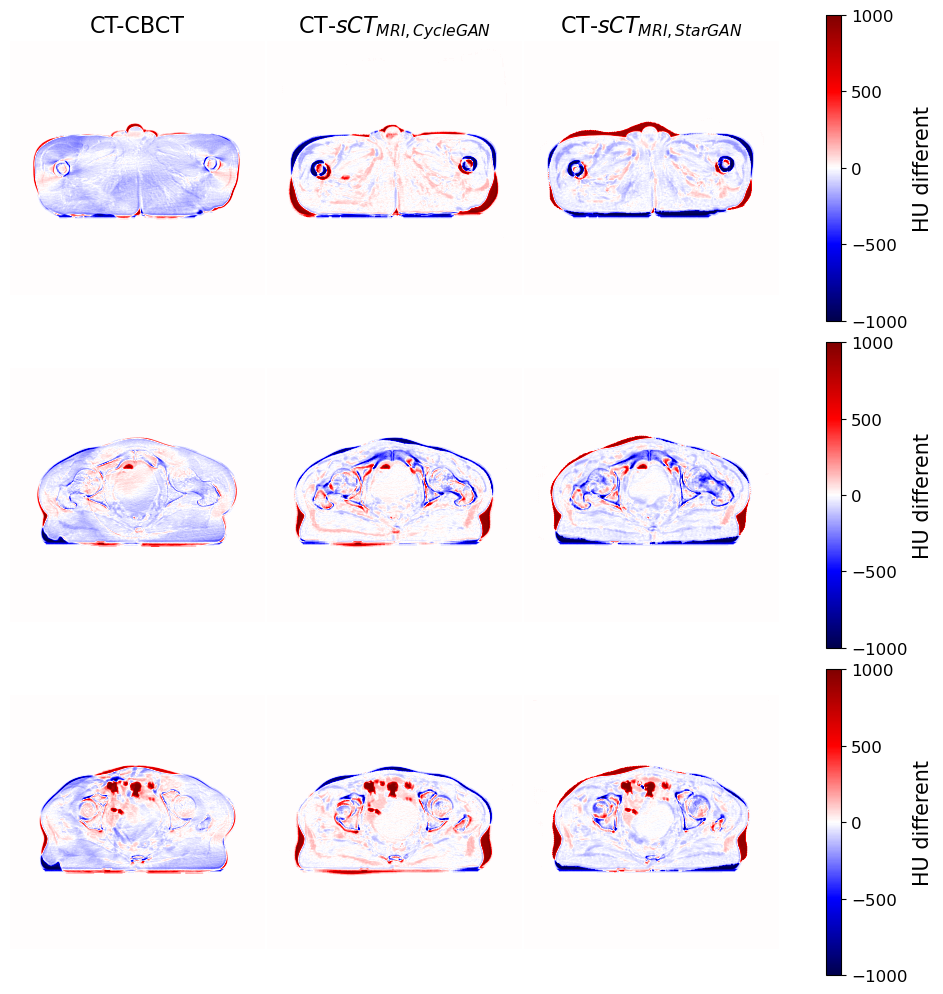

In [113]:
dict = {11:0, 12:1, 22:2, 41:3, 42:4}
case = [dict[11], dict[22], dict[11], dict[11]]
slice = [2, 22, 33, 41]

cbct_diff_c1 = cbct[case[0]][slice[0]] - ct[case[0]][slice[0]]
ccb_diff_c1 =  cmr[case[0]][slice[0]] - ct[case[0]][slice[0]]
scb_diff_c1 =  smr[case[0]][slice[0]] - ct[case[0]][slice[0]]

cbct_diff_c2 = cbct[case[1]][slice[1]] - ct[case[1]][slice[1]] 
ccb_diff_c2 = cmr[case[1]][slice[1]] - ct[case[1]][slice[1]] 
scb_diff_c2 = smr[case[1]][slice[1]] - ct[case[1]][slice[1]]  

cbct_diff_c3 = cbct[case[2]][slice[2]] - ct[case[2]][slice[2]] 
ccb_diff_c3 = cmr[case[2]][slice[2]] - ct[case[2]][slice[2]] 
scb_diff_c3 = smr[case[2]][slice[2]] - ct[case[2]][slice[2]] 

cbct_diff_c4 = cbct[case[3]][slice[3]] - ct[case[3]][slice[3]] 
ccb_diff_c4 = cmr[case[3]][slice[3]] - ct[case[3]][slice[3]] 
scb_diff_c4 = smr[case[3]][slice[3]] - ct[case[3]][slice[3]] 

fig, axs = plt.subplots(3, 3, figsize=(12, 12), sharex=True, sharey=True)
fig.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.07) # height reserved for space between subplots

data_list = [cbct_diff_c1, ccb_diff_c1, scb_diff_c1, 
             cbct_diff_c3, ccb_diff_c3, scb_diff_c3, 
             cbct_diff_c4, ccb_diff_c4, scb_diff_c4, ]
titles = ["CT-CBCT", "CT-$sCT_{MRI,CycleGAN}$", "CT-$sCT_{MRI,StarGAN}$", 
          "CBCT-c3", "CCB-c3", "SCB-c3", 
          "CBCT-c4", "CCB-c4", "SCB-c3", ]

for i, (data, title, ax) in enumerate(zip(data_list, titles, axs.flat)):
    im = ax.imshow(data, cmap='seismic', vmin=-1000, vmax=1000)
    if i < 3:  # Add titles only for the first row
        ax.set_title(title, fontsize=16)
    ax.axis('off')

    # Add colorbar for each row, starting from the second subplot
    if i % 3 == 1:
        cbar = fig.colorbar(im, ax=axs[i // 3, :], label='HU different', location='right')
        cbar.ax.tick_params(labelsize=12)
        cbar.set_label('HU different', fontsize=15)
        cbar.set_ticks([-1000, -500, 0, 500, 1000])
plt.show()

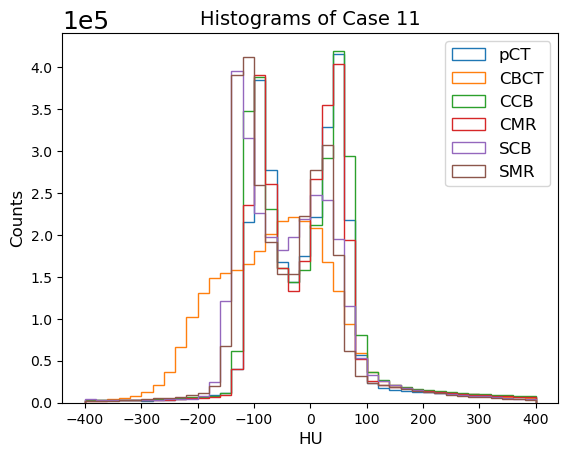

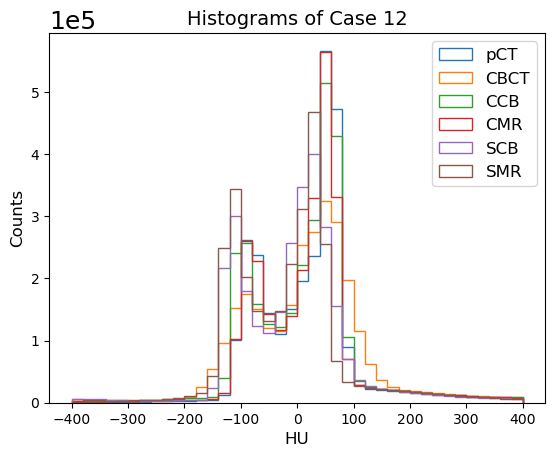

In [126]:
dict = {11:0, 12:1, 41:3, 42:4}
case = [dict[11], dict[12], dict[11], dict[11]]
case_title = [11,12,11,11]

for i in range(2):
    data1 =  ct[case[i]].flatten()
    data2 =  cbct[case[i]].flatten()
    data3 = ccb[case[i]].flatten()
    data4 = cmr[case[i]].flatten()
    data5 = scb[case[i]].flatten()
    data6 = smr[case[i]].flatten()

    # Calculate histograms with desired number of bins
    counts1, bins, patches = plt.hist(data1, bins=40, range=(-400, 400), histtype='step')
    counts2, bins, patches = plt.hist(data2, bins=bins, range=(-400, 400), histtype='step')
    counts3, bins, patches = plt.hist(data3, bins=bins, range=(-400, 400), histtype='step')
    counts4, bins, patches = plt.hist(data4, bins=bins, range=(-400, 400), histtype='step')
    counts5, bins, patches = plt.hist(data5, bins=bins, range=(-400, 400), histtype='step')
    counts6, bins, patches = plt.hist(data6, bins=bins, range=(-400, 400), histtype='step')

    # Customize plot elements
    plt.xlabel('HU', fontsize=12)
    plt.ylabel('Counts', fontsize=12)
    plt.title(f'Histograms of Case {case_title[i]}', fontsize=14)
    plt.legend(['pCT', 'CBCT', 'CCB', 'CMR', 'SCB', 'SMR'], fontsize=12)

    # Adjust y-axis tick labels to include "x10^5"
    plt.ticklabel_format(axis='y', style='sci', scilimits=(0,0))  # Format as scientific notation with 0 decimal places
    plt.tick_params(labelsize=10)

    plt.show()


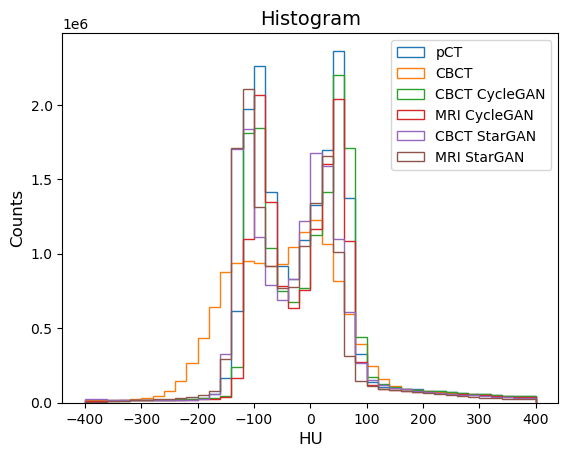

In [130]:
data1 =  ct.flatten()
data2 =  cbct.flatten()
data3 = ccb.flatten()
data4 = cmr.flatten()
data5 = scb.flatten()
data6 = smr.flatten()
# Calculate histograms with desired number of bins
counts1, bins, patches = plt.hist(data1, bins=40, range=(-400, 400), histtype='step')
counts2, bins, patches = plt.hist(data2, bins=bins, range=(-400, 400), histtype='step')
counts3, bins, patches = plt.hist(data3, bins=bins, range=(-400, 400), histtype='step')
counts4, bins, patches = plt.hist(data4, bins=bins, range=(-400, 400), histtype='step')
counts5, bins, patches = plt.hist(data5, bins=bins, range=(-400, 400), histtype='step')
counts6, bins, patches = plt.hist(data6, bins=bins, range=(-400, 400), histtype='step')
# Customize plot elements
plt.xlabel('HU', fontsize=12)
plt.ylabel('Counts', fontsize=12)
#plt.title(f'Histograms of all test case')
plt.title(f'Histogram', fontsize=14)
plt.legend(['pCT', 'CBCT', 'CBCT CycleGAN', 'MRI CycleGAN', 'CBCT StarGAN', 'MRI StarGAN'], fontsize=10)
# Adjust y-axis tick labels to include "x10^5"
plt.tick_params(labelsize=10)
plt.ticklabel_format(axis='y', style='sci', scilimits=(0,0))  # Format as scientific notation with 0 decimal places
# Set the font size of the scientific notation (like "1e5")
ax = plt.gca()  # Get the current axis
ax.yaxis.get_offset_text().set_fontsize(10)  # Set the font size to 12 (adjust as needed)
plt.show()

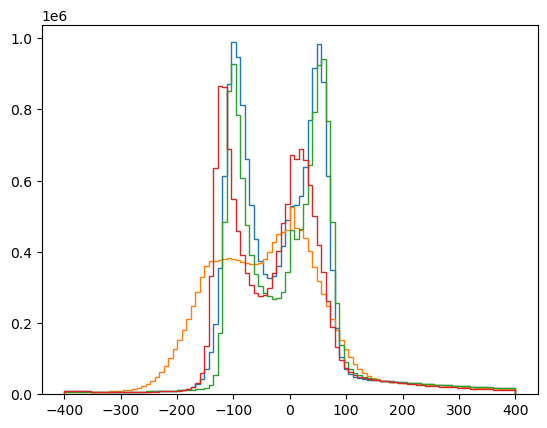

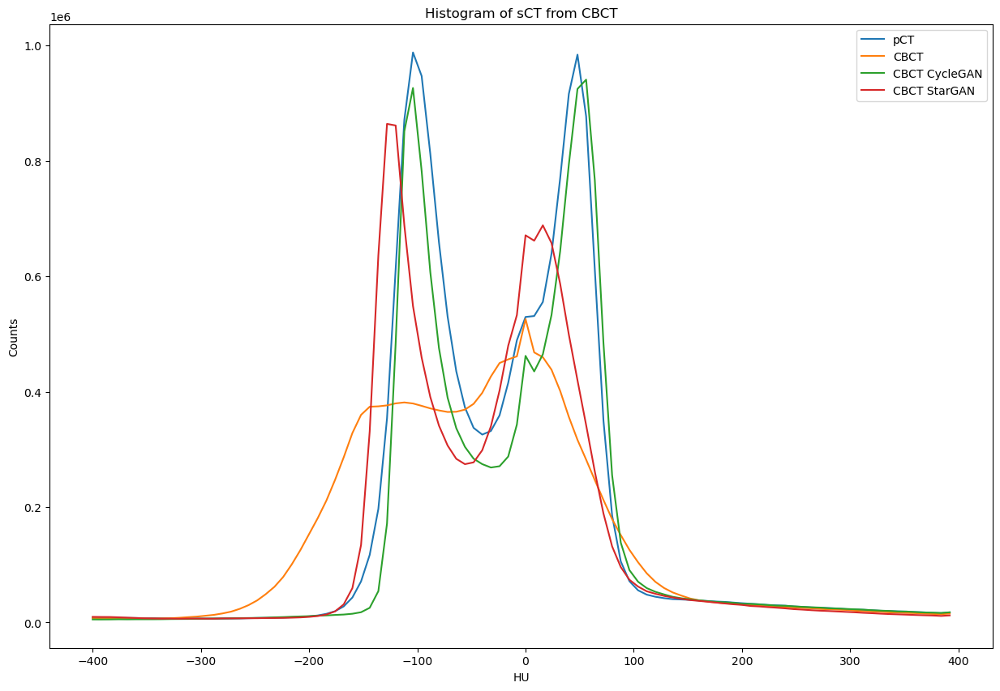

In [27]:
data1 =  ct.flatten()
data2 =  cbct.flatten()
data3 = ccb.flatten()
data5 = scb.flatten()
# Calculate histograms with desired number of bins
counts1, bins, patches = plt.hist(data1, bins=100, range=(-400, 400), histtype='step')
counts2, bins, patches = plt.hist(data2, bins=bins, range=(-400, 400), histtype='step')
counts3, bins, patches = plt.hist(data3, bins=bins, range=(-400, 400), histtype='step')
counts5, bins, patches = plt.hist(data5, bins=bins, range=(-400, 400), histtype='step')
plt.figure(figsize=(15,10))
plt.plot(bins[:-1], counts1)
plt.plot(bins[:-1], counts2)
plt.plot(bins[:-1], counts3)
plt.plot(bins[:-1], counts5)
# Customize plot elements
plt.xlabel('HU')
plt.ylabel('Counts')
#plt.title(f'Histograms of all test case')
plt.title(f'Histogram of sCT from CBCT')
plt.legend(['pCT', 'CBCT', 'CBCT CycleGAN', 'CBCT StarGAN'])
# Adjust y-axis tick labels to include "x10^5"
plt.ticklabel_format(axis='y', style='sci', scilimits=(0,0))  # Format as scientific notation with 0 decimal places
plt.show()

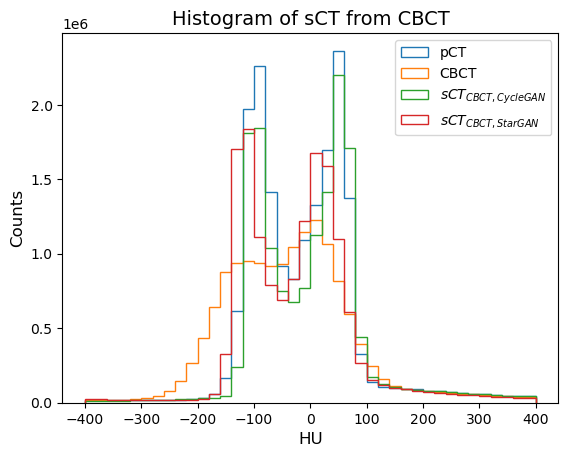

In [131]:
data1 =  ct.flatten()
data2 =  cbct.flatten()
data3 = ccb.flatten()
data5 = scb.flatten()
# Calculate histograms with desired number of bins
counts1, bins, patches = plt.hist(data1, bins=40, range=(-400, 400), histtype='step')
counts2, bins, patches = plt.hist(data2, bins=bins, range=(-400, 400), histtype='step')
counts3, bins, patches = plt.hist(data3, bins=bins, range=(-400, 400), histtype='step')
counts5, bins, patches = plt.hist(data5, bins=bins, range=(-400, 400), histtype='step')
# Customize plot elements
plt.xlabel('HU', fontsize=12)
plt.ylabel('Counts', fontsize=12)
#plt.title(f'Histograms of all test case')
plt.title(f'Histogram of sCT from CBCT', fontsize=14)
plt.legend(['pCT', 'CBCT', '$sCT_{CBCT,CycleGAN}$', '$sCT_{CBCT,StarGAN}$'], fontsize=10)
# Adjust y-axis tick labels to include "x10^5"
plt.tick_params(labelsize=10)
plt.ticklabel_format(axis='y', style='sci', scilimits=(0,0))  # Format as scientific notation with 0 decimal places
# Set the font size of the scientific notation (like "1e5")
ax = plt.gca()  # Get the current axis
ax.yaxis.get_offset_text().set_fontsize(10)  # Set the font size to 12 (adjust as needed)
plt.show()

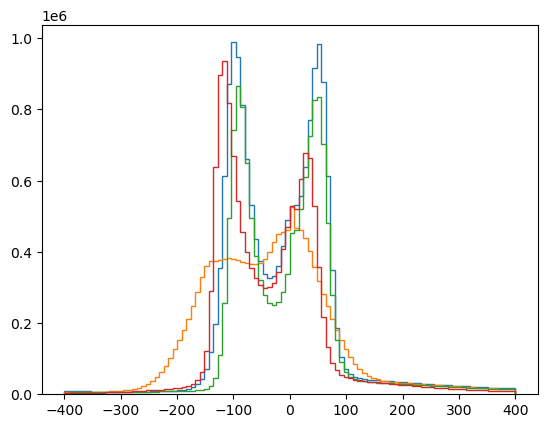

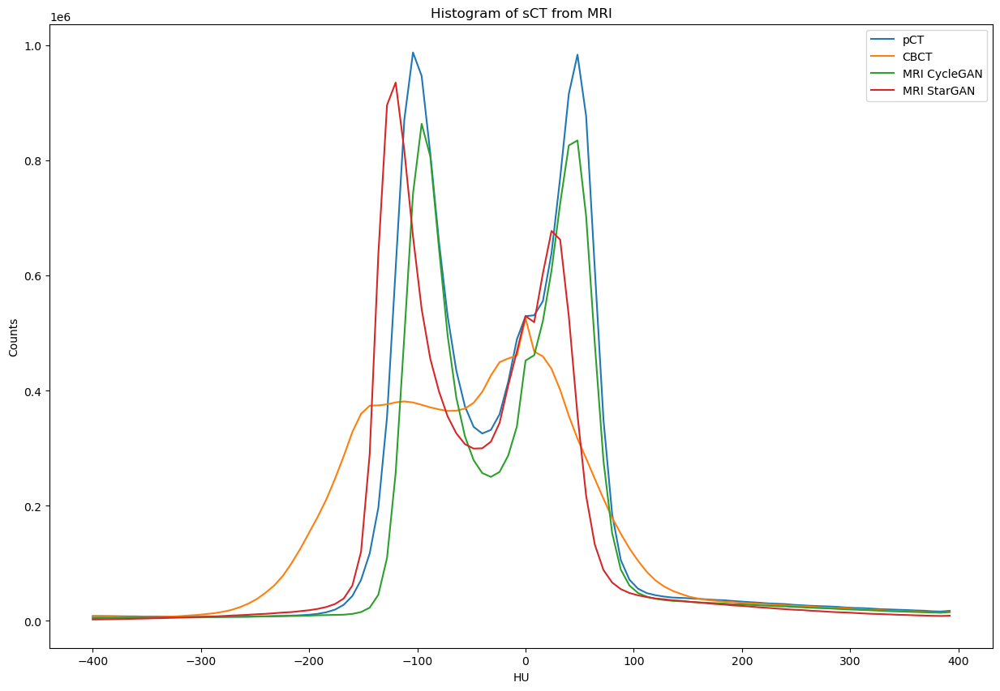

In [29]:
data1 =  ct.flatten()
data2 =  cbct.flatten()
data4 = cmr.flatten()
data6 = smr.flatten()
# Calculate histograms with desired number of bins
counts1, bins, patches = plt.hist(data1, bins=100, range=(-400, 400), histtype='step')
counts2, bins, patches = plt.hist(data2, bins=bins, range=(-400, 400), histtype='step')
counts4, bins, patches = plt.hist(data4, bins=bins, range=(-400, 400), histtype='step')
counts6, bins, patches = plt.hist(data6, bins=bins, range=(-400, 400), histtype='step')

plt.figure(figsize=(15,10))
plt.plot(bins[:-1], counts1)
plt.plot(bins[:-1], counts2)
plt.plot(bins[:-1], counts4)
plt.plot(bins[:-1], counts6)
# Customize plot elements
plt.xlabel('HU')
plt.ylabel('Counts')
#plt.title(f'Histograms of all test case')
plt.title(f'Histogram of sCT from MRI')
plt.legend(['pCT', 'CBCT', 'MRI CycleGAN', 'MRI StarGAN'])
# Adjust y-axis tick labels to include "x10^5"
plt.tick_params(labelsize=10)
plt.ticklabel_format(axis='y', style='sci', scilimits=(0,0))  # Format as scientific notation with 0 decimal places
# Set the font size of the scientific notation (like "1e5")
ax = plt.gca()  # Get the current axis
ax.yaxis.get_offset_text().set_fontsize(10)  # Set the font size to 12 (adjust as needed)
plt.show()

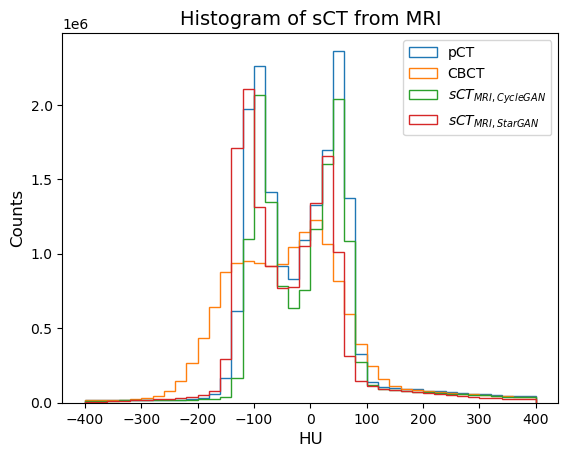

In [133]:
data1 =  ct.flatten()
data2 =  cbct.flatten()
data3 = cmr.flatten()
data5 = smr.flatten()
# Calculate histograms with desired number of bins
counts1, bins, patches = plt.hist(data1, bins=40, range=(-400, 400), histtype='step')
counts2, bins, patches = plt.hist(data2, bins=bins, range=(-400, 400), histtype='step')
counts3, bins, patches = plt.hist(data3, bins=bins, range=(-400, 400), histtype='step')
counts5, bins, patches = plt.hist(data5, bins=bins, range=(-400, 400), histtype='step')
# Customize plot elements
plt.xlabel('HU', fontsize=12)
plt.ylabel('Counts', fontsize=12)
#plt.title(f'Histograms of all test case')
plt.title(f'Histogram of sCT from MRI', fontsize=14)
plt.legend(['pCT', 'CBCT', '$sCT_{MRI,CycleGAN}$', '$sCT_{MRI,StarGAN}$'], fontsize=10)
# Adjust y-axis tick labels to include "x10^5"
plt.tick_params(labelsize=10)
plt.ticklabel_format(axis='y', style='sci', scilimits=(0,0))  # Format as scientific notation with 0 decimal places
# Set the font size of the scientific notation (like "1e5")
ax = plt.gca()  # Get the current axis
ax.yaxis.get_offset_text().set_fontsize(10)  # Set the font size to 12 (adjust as needed)
plt.show()

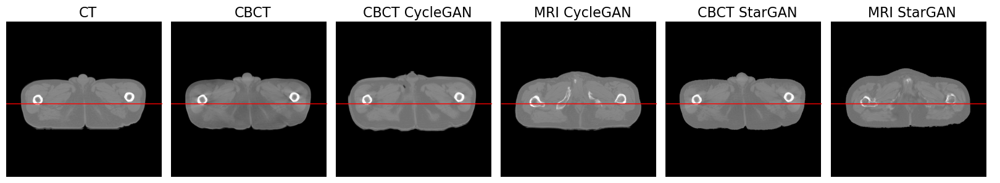

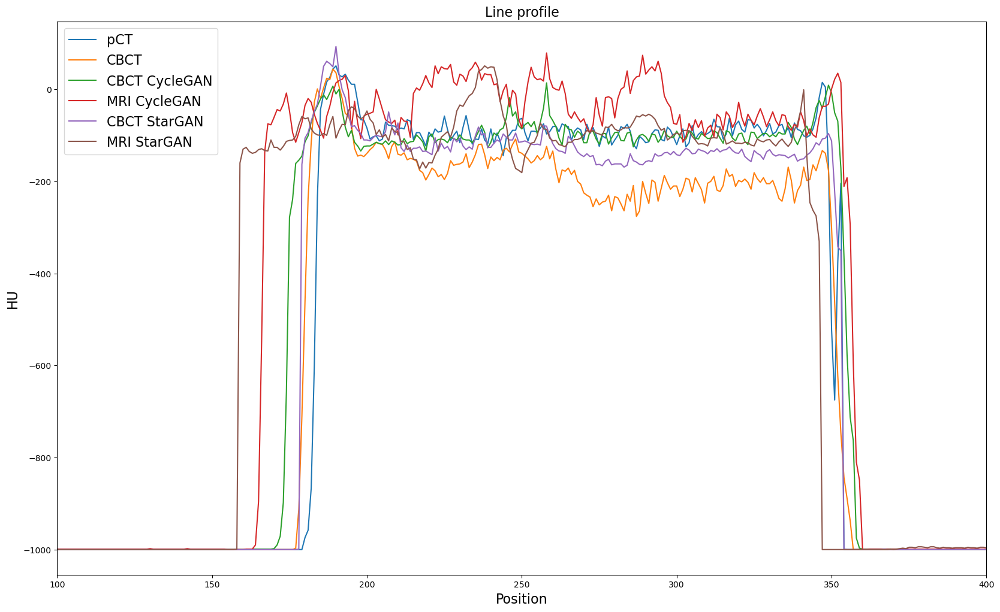

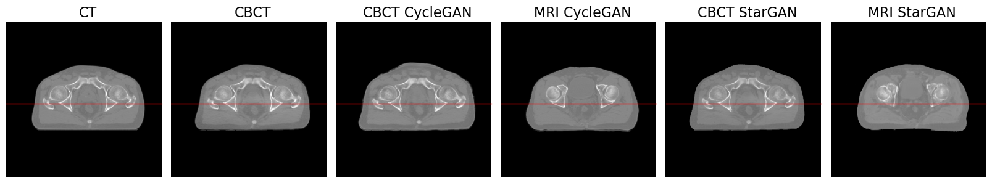

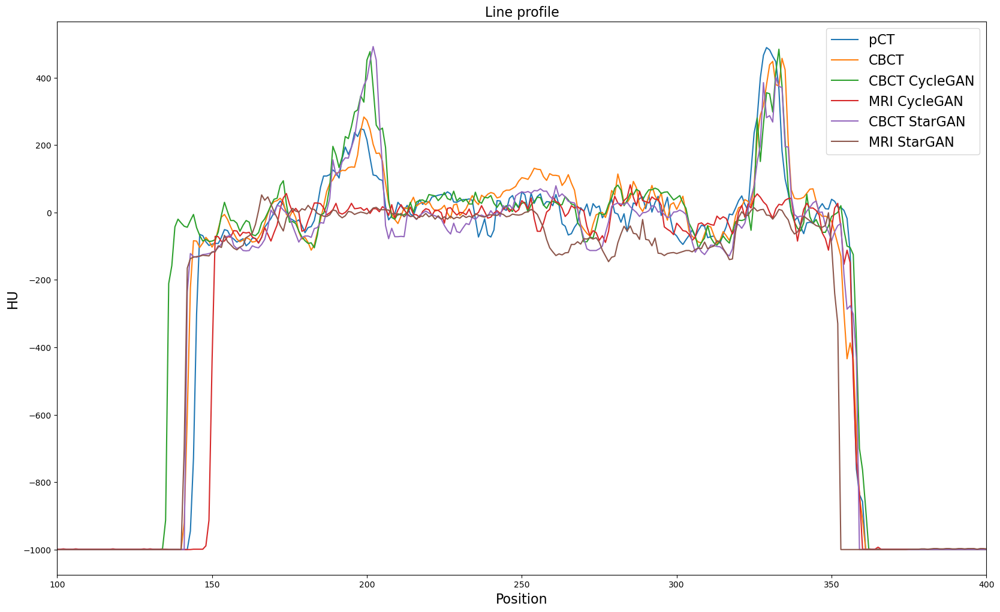

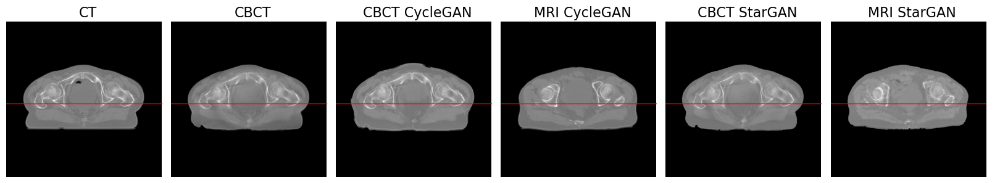

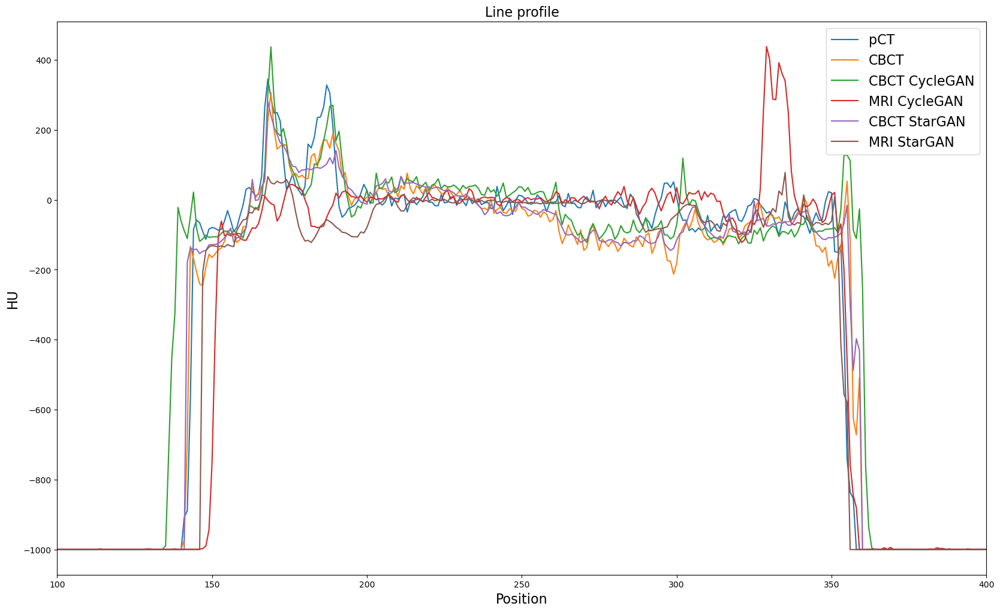

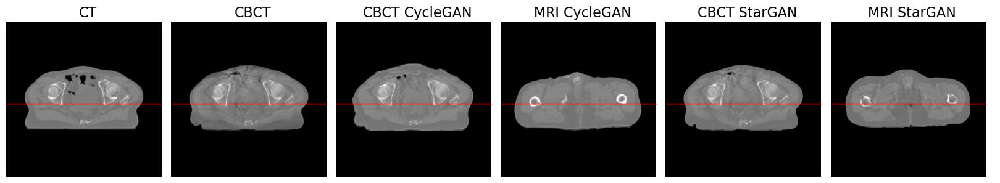

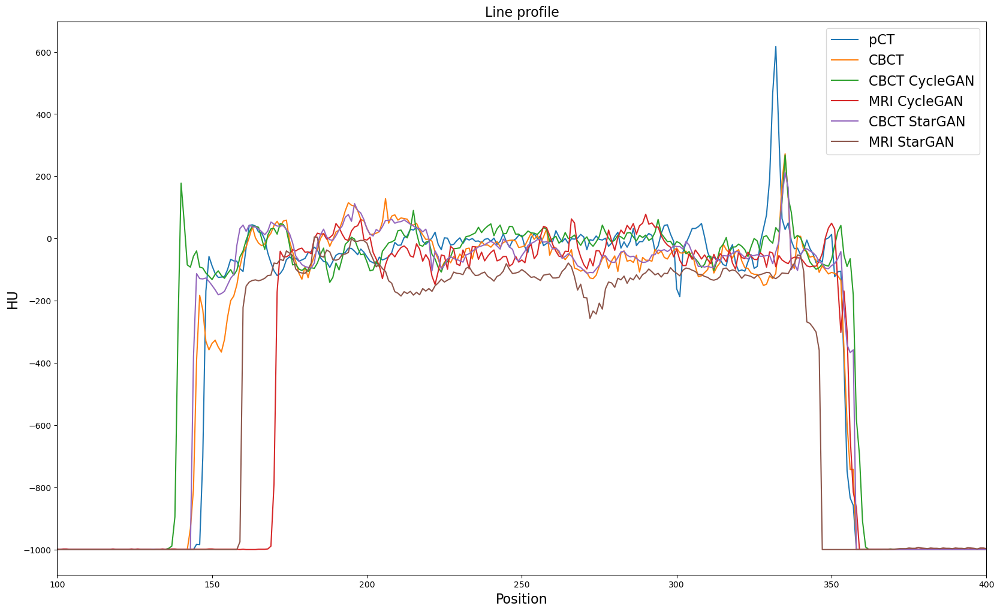

In [31]:
dict = {11:0, 12:1, 41:3, 42:4}
case_title = [11,22,11,22]
case = [dict[11], dict[12], dict[11], dict[11]]
slice = [2, 22, 33, 41]
y = 270

for c in range(len(case)):
    plt.figure(figsize=(20,4))
    plt.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.01) # height reserved for space between subplots
    plt.subplot(1,6,1); plt.imshow(ct[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('CT', fontsize=16)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    plt.subplot(1,6,2); plt.imshow(cbct[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('CBCT', fontsize=16)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    plt.subplot(1,6,3); plt.imshow(ccb[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('CBCT CycleGAN', fontsize=16)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    plt.subplot(1,6,4); plt.imshow(cmr[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('MRI CycleGAN', fontsize=16)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    plt.subplot(1,6,5); plt.imshow(scb[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('CBCT StarGAN', fontsize=16)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    plt.subplot(1,6,6); plt.imshow(smr[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('MRI StarGAN', fontsize=16)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    plt.show()

    plt.figure(figsize=(20,12))
    data1 =  ct[case[c]][slice[c]]
    data2 =  cbct[case[c]][slice[c]]
    data3 = ccb[case[c]][slice[c]]
    data4 = cmr[case[c]][slice[c]]
    data5 = scb[case[c]][slice[c]]
    data6 = smr[case[c]][slice[c]]
    plt.plot(data1[:,y])
    plt.plot(data2[:,y])
    plt.plot(data3[:,y])
    plt.plot(data4[:,y])
    plt.plot(data5[:,y])
    plt.plot(data6[:,y])
    # Customize plot elements
    plt.xlim(100, 400)  # Set the visual range of the x-axis
    plt.xlabel('Position', fontsize=16)
    plt.ylabel('HU', fontsize=16)
    #plt.title(f'Line profile of Case {case_title[c]} slice {slice[c]}')
    plt.title(f'Line profile', fontsize=16)
    plt.legend(['pCT', 'CBCT', 'CBCT CycleGAN', 'MRI CycleGAN', 'CBCT StarGAN', 'MRI StarGAN'], fontsize=16)
    plt.show()


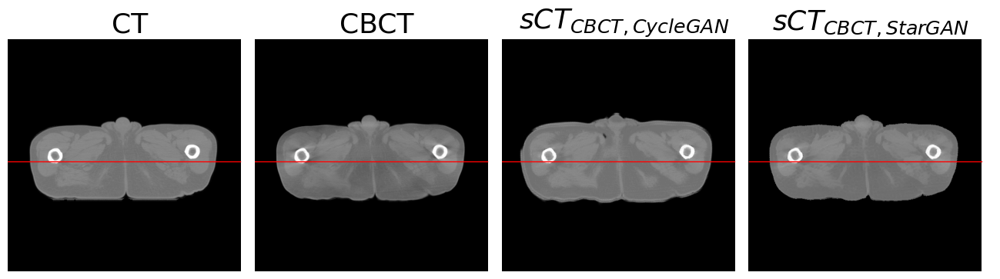

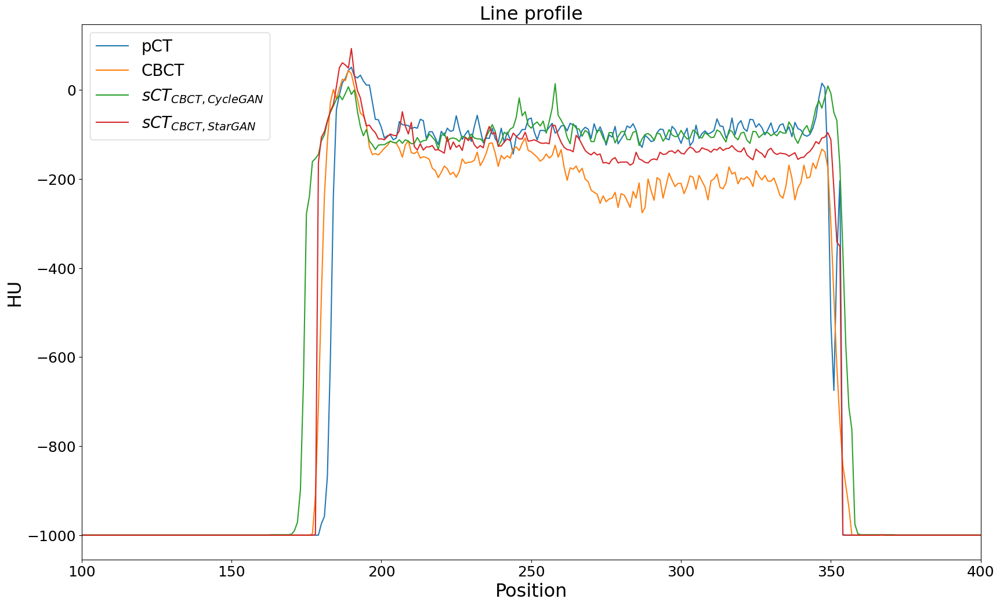

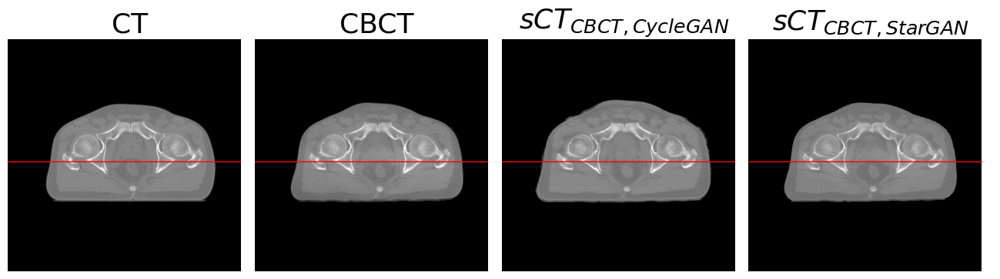

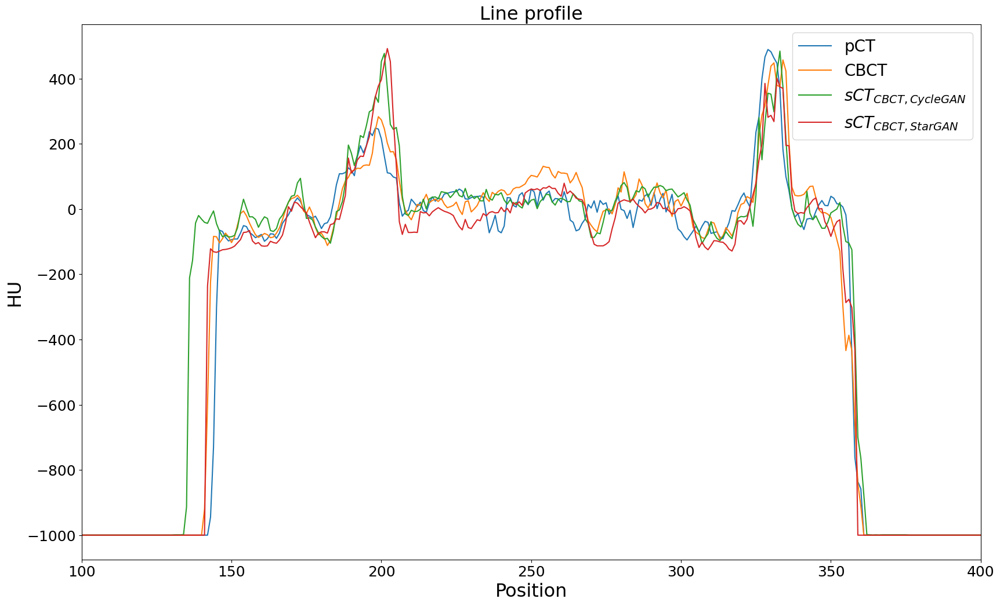

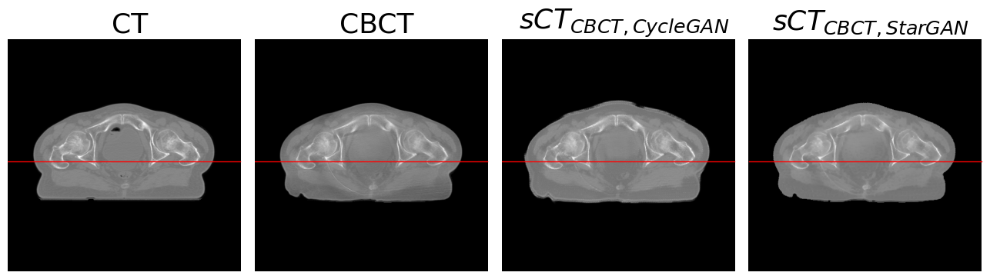

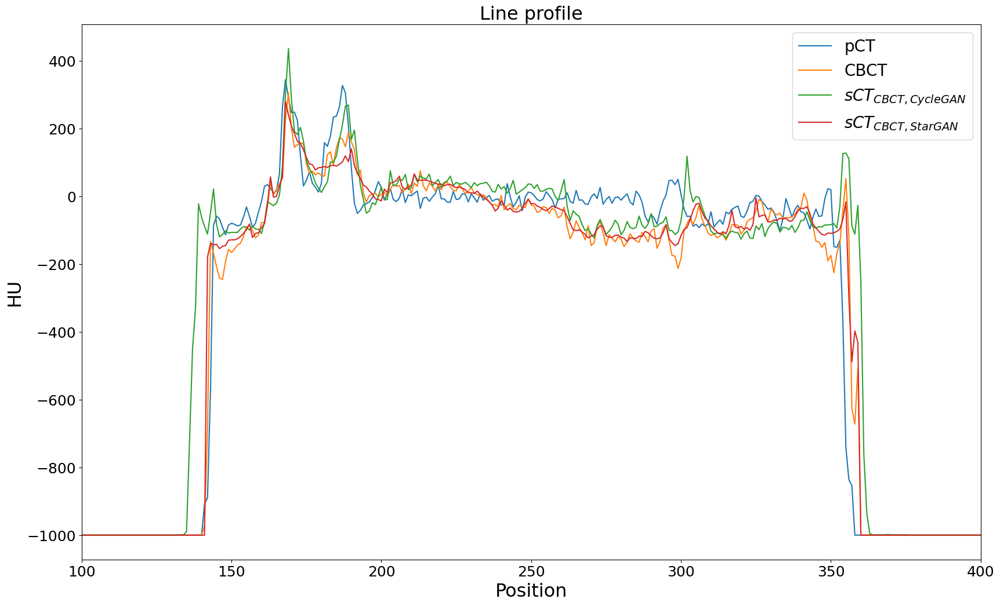

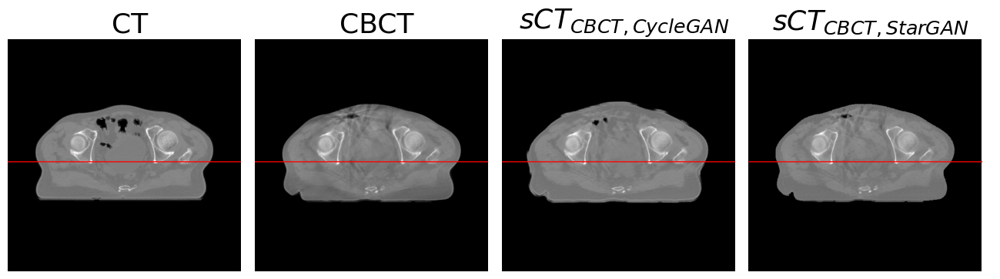

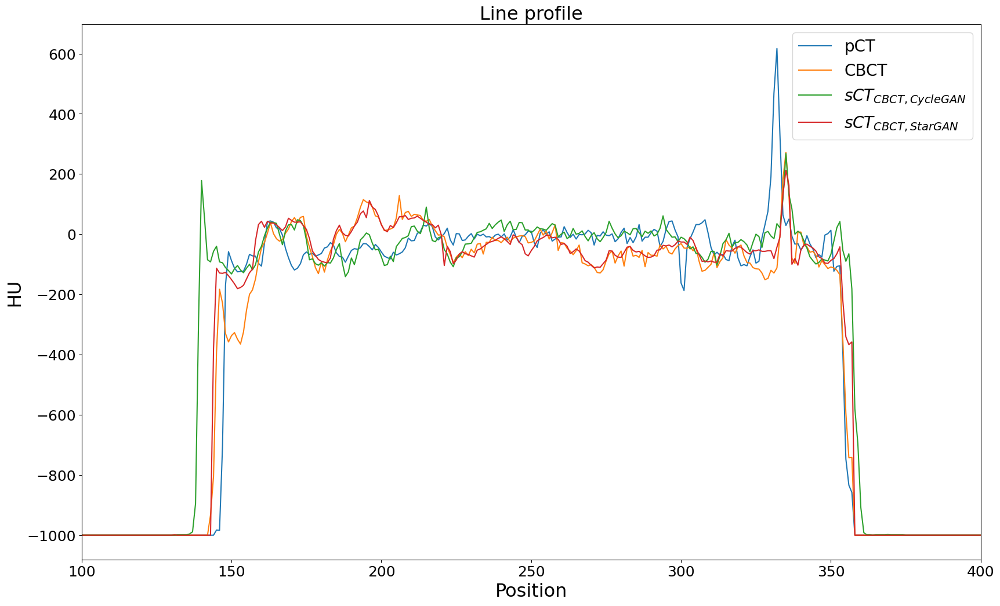

In [32]:
dict = {11:0, 12:1, 41:3, 42:4}
case_title = [11,22,11,22]
case = [dict[11], dict[12], dict[11], dict[11]]
slice = [2, 22, 33, 41]
y = 270

for c in range(len(case)):
    plt.figure(figsize=(16,4))
    plt.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.01) # height reserved for space between subplots
    plt.subplot(1,4,1); plt.imshow(ct[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('CT', fontsize=26)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    plt.subplot(1,4,2); plt.imshow(cbct[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('CBCT', fontsize=26)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    plt.subplot(1,4,3); plt.imshow(ccb[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('$sCT_{CBCT,CycleGAN}$', fontsize=26)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)

    plt.subplot(1,4,4); plt.imshow(scb[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('$sCT_{CBCT,StarGAN}$', fontsize=26)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)

    plt.show()

    plt.figure(figsize=(20,12))
    plt.rc('font', size=18)
    data1 =  ct[case[c]][slice[c]]
    data2 =  cbct[case[c]][slice[c]]
    data3 = ccb[case[c]][slice[c]]

    data5 = scb[case[c]][slice[c]]

    plt.plot(data1[:,y])
    plt.plot(data2[:,y])
    plt.plot(data3[:,y])

    plt.plot(data5[:,y])

    # Customize plot elements
    plt.xlim(100, 400)  # Set the visual range of the x-axis
    plt.xlabel('Position', fontsize=23)
    plt.ylabel('HU', fontsize=23)
    #plt.title(f'Line profile of Case {case_title[c]} slice {slice[c]}')
    plt.title(f'Line profile', fontsize=23)
    plt.legend(['pCT', 'CBCT', '$sCT_{CBCT,CycleGAN}$', '$sCT_{CBCT,StarGAN}$'], fontsize=20)
    plt.show()

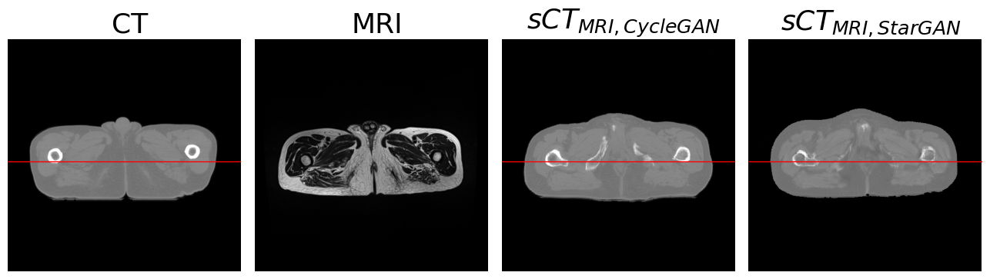

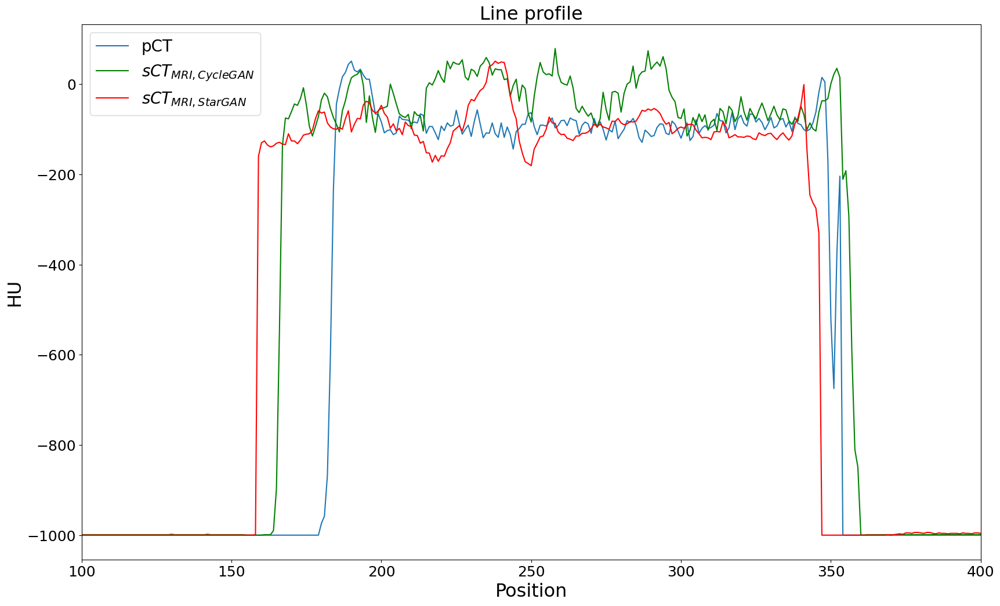

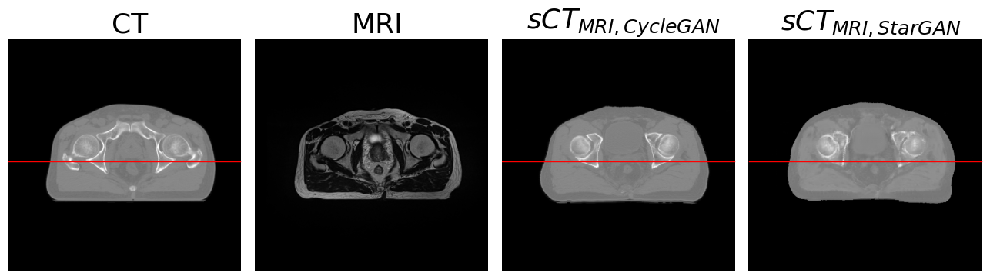

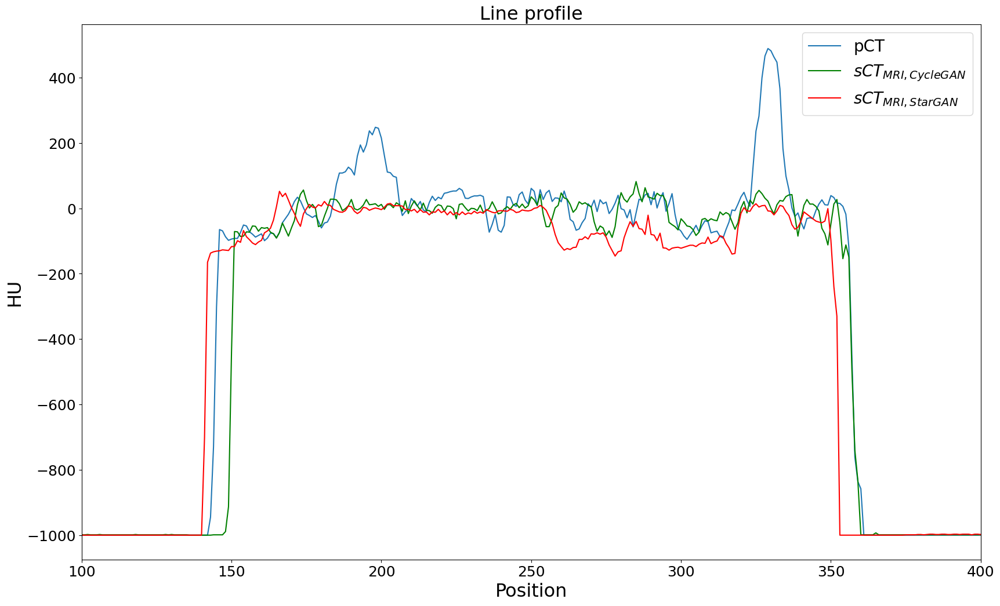

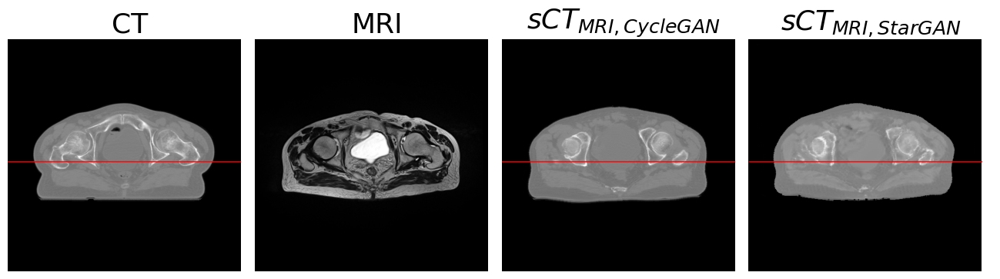

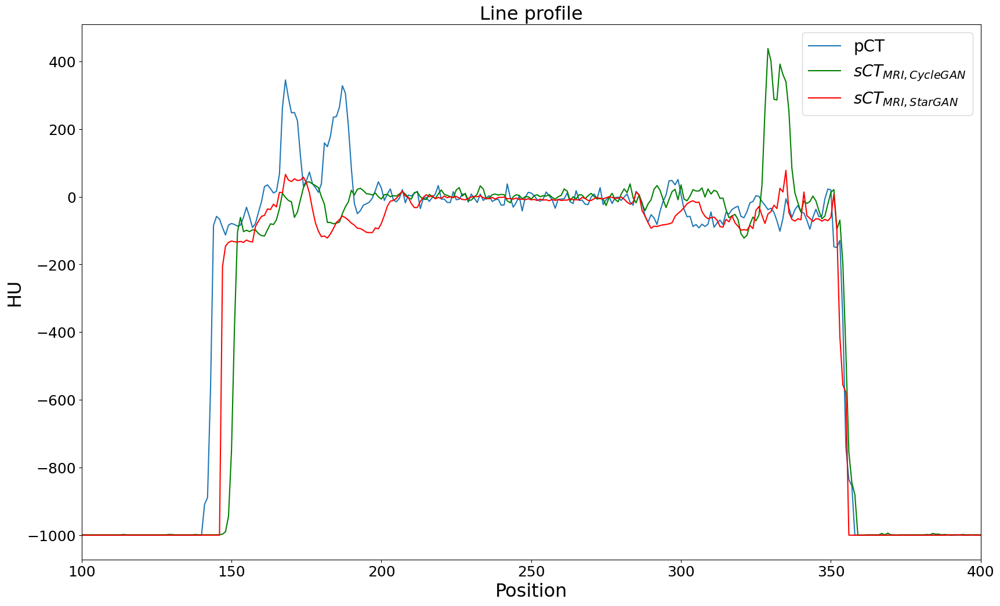

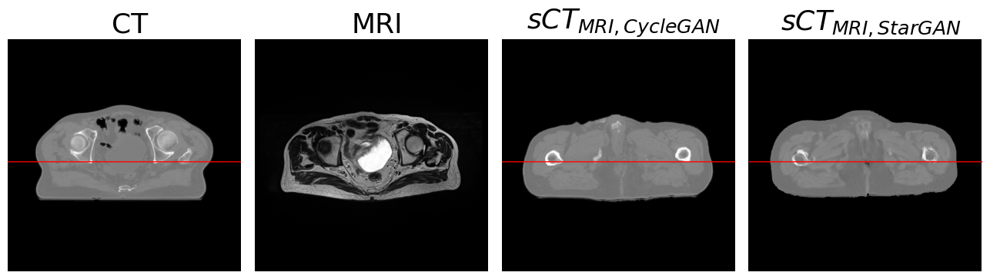

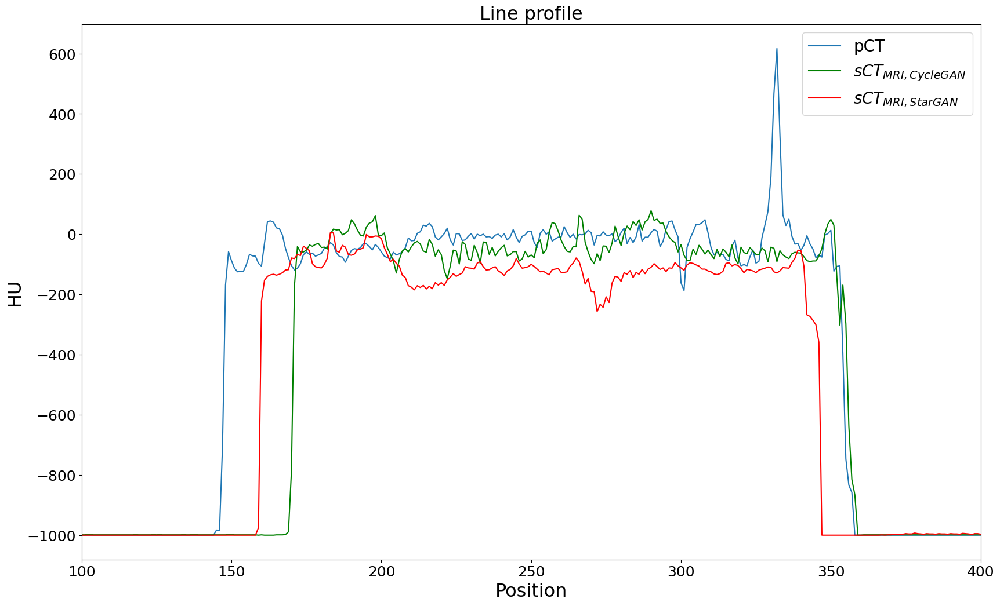

In [33]:
dict = {11:0, 12:1, 41:3, 42:4}
case_title = [11,22,11,22]
case = [dict[11], dict[12], dict[11], dict[11]]
slice = [2, 22, 33, 41]
y = 270

for c in range(len(case)):
    plt.figure(figsize=(16,4))
    plt.subplots_adjust(left=0.1,  # left margin
                    right=0.9,  # right margin
                    bottom=0.1, # bottom margin
                    top=0.9,    # top margin
                    wspace=0.01, # width reserved for space between subplots
                    hspace=0.01) # height reserved for space between subplots
    plt.subplot(1,4,1); plt.imshow(ct[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('CT', fontsize=26)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    plt.subplot(1,4,2); plt.imshow(mri[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('MRI', fontsize=26)
    plt.plot([0, 512], [y,y], color='red', linewidth=1, alpha=0)
    
    plt.subplot(1,4,3); plt.imshow(cmr[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('$sCT_{MRI,CycleGAN}$', fontsize=26)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    
    plt.subplot(1,4,4); plt.imshow(smr[case[c]][slice[c]], cmap='gray'); plt.axis('off'); plt.title('$sCT_{MRI,StarGAN}$', fontsize=26)
    plt.plot([0, 512], [y,y], color='red', linewidth=1)
    plt.show()

    plt.figure(figsize=(20,12))
    plt.rc('font', size=18)
    data1 =  ct[case[c]][slice[c]]
    #data2 =  mri[case[c]][slice[c]]
    
    data4 = cmr[case[c]][slice[c]]
    
    data6 = smr[case[c]][slice[c]]
    plt.plot(data1[:,y])
    #plt.plot(data2[:,y])
    
    plt.plot(data4[:,y], color='g')
    
    plt.plot(data6[:,y], color='r')
    # Customize plot elements
    plt.xlim(100, 400)  # Set the visual range of the x-axis
    plt.xlabel('Position', fontsize=23)
    plt.ylabel('HU', fontsize=23)
    #plt.title(f'Line profile of Case {case_title[c]} slice {slice[c]}')
    plt.title(f'Line profile', fontsize=23)
    plt.legend(['pCT', '$sCT_{MRI,CycleGAN}$', '$sCT_{MRI,StarGAN}$'], fontsize=20)
    plt.show()


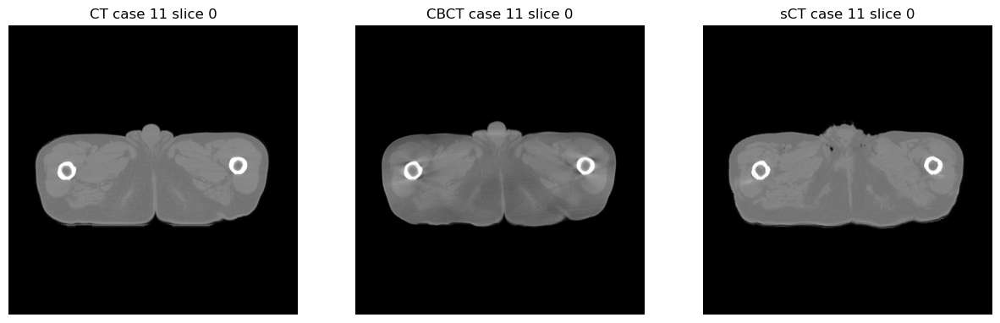

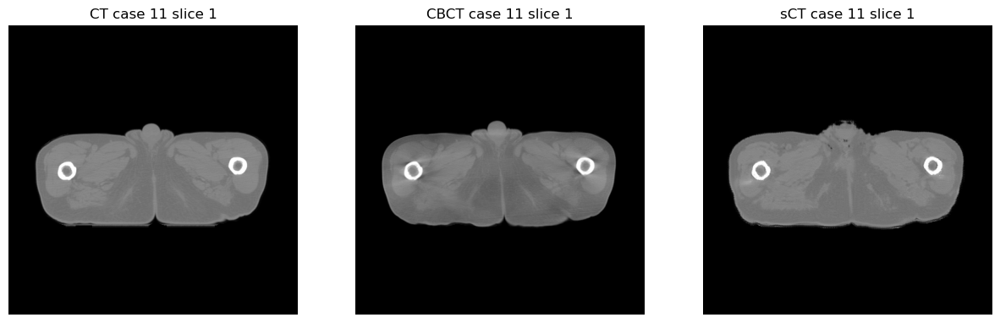

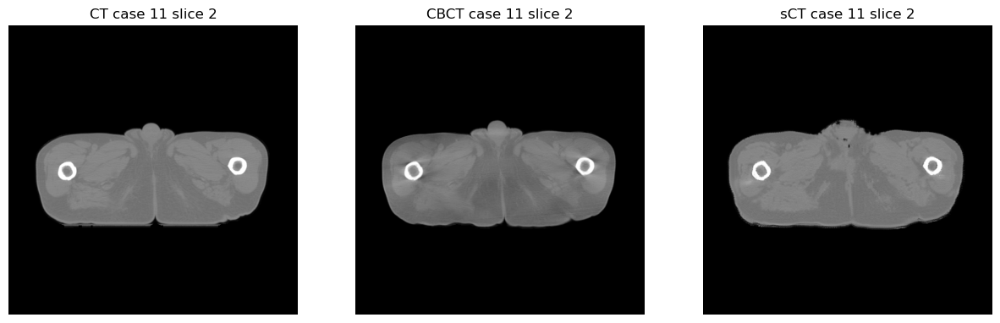

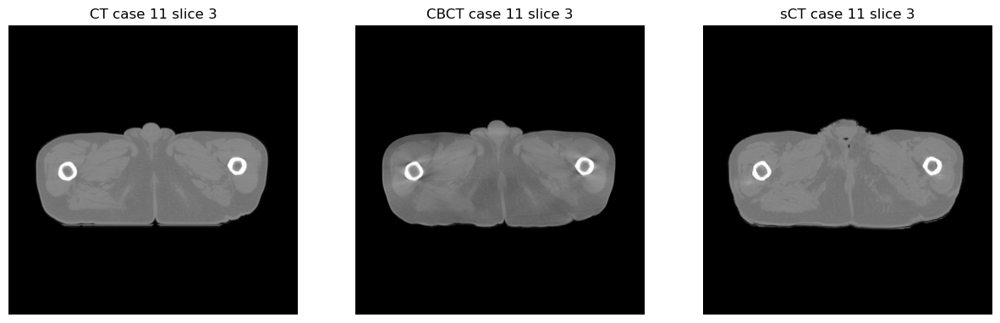

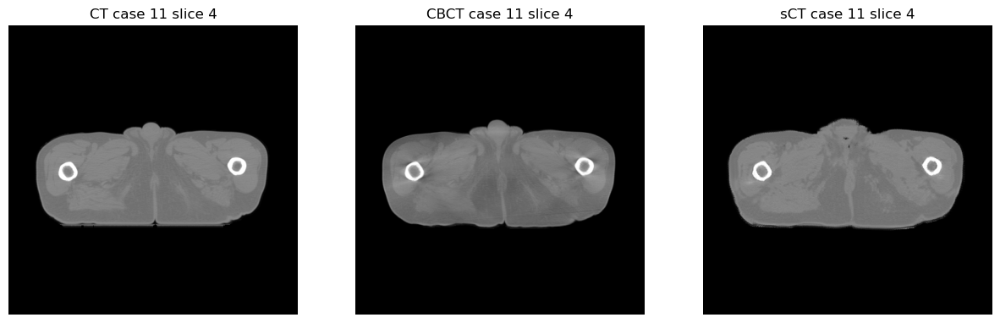

...

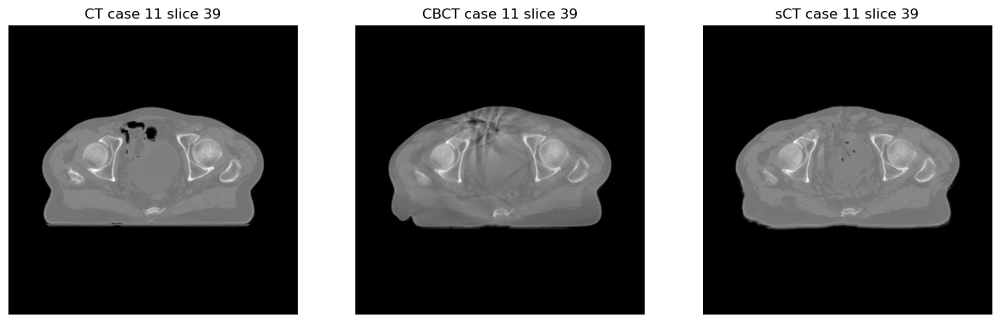

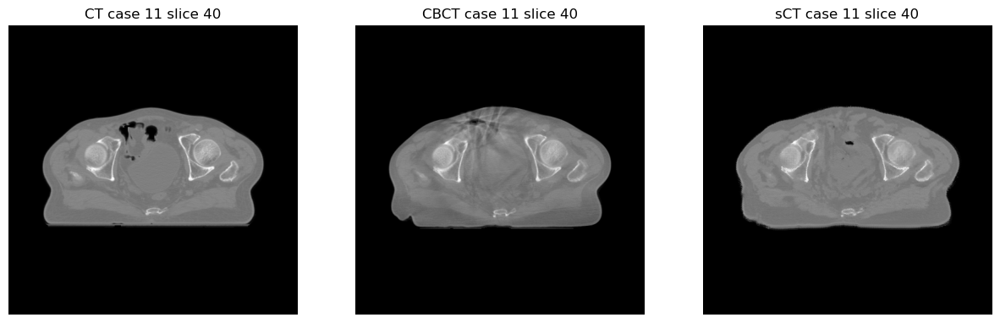

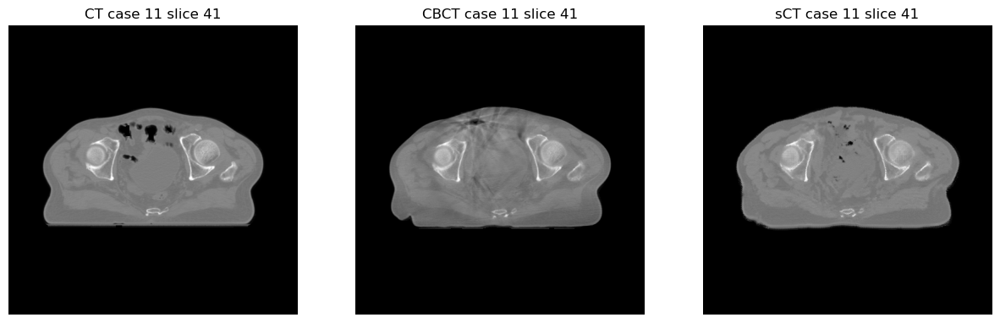

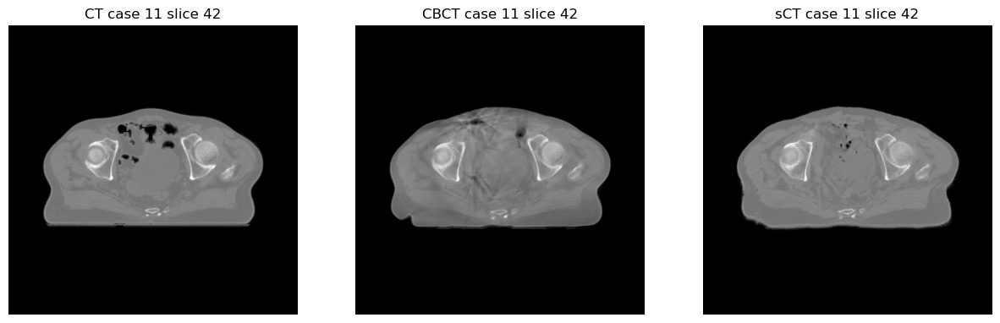

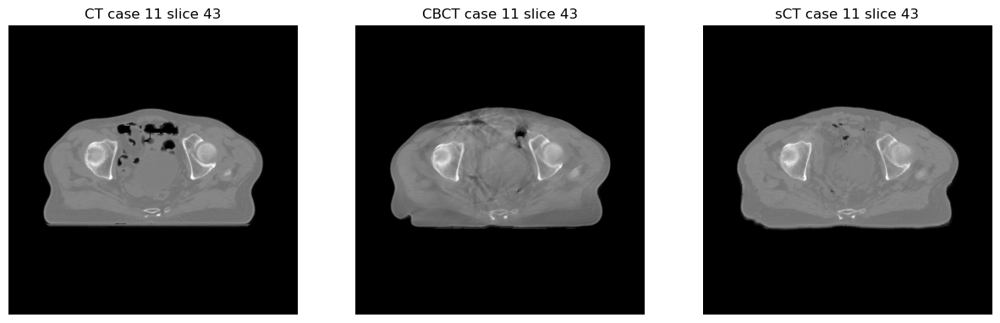

In [38]:
case = 11
ct_path = f'/Users/paritt.w/Desktop/Thesis_local/test/case {case}/CT'
cbct_path = f'/Users/paritt.w/Desktop/Thesis_local/test/case {case}/CBCT'
sct_path = f'/Users/paritt.w/Desktop/Thesis_local/train_model/CycleCBCT/results/itemA_DICOM/Case_{case}'

for i in range(44):    
    slice = i

    ct = read_dicom_series(ct_path)
    cbct = read_dicom_series(cbct_path)
    sct = read_dicom_series(sct_path)

    plt.figure(figsize=(15, 15))
    plt.subplot(1,3,1); plt.imshow(ct[slice], cmap='gray'); plt.axis('off'); plt.title(f'CT case {case} slice {i}')
    plt.subplot(1,3,2); plt.imshow(cbct[slice], cmap='gray'); plt.axis('off'); plt.title(f'CBCT case {case} slice {i}')
    plt.subplot(1,3,3); plt.imshow(sct[slice], cmap='gray'); plt.axis('off'); plt.title(f'sCT case {case} slice {i}')
    plt.show()